# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> CS109B: Advanced Topics in Data Science 

## **Final Project:** Detection of COVID-19 from X-Ray Images

**Harvard University - Spring 2024**<br/>

### **Group 7 - Team Members:**: 

* Herman Tjahjadi
* Jacqueline Jiang
* Jinyu Han
* Ming Xia
* Paul Li

In [134]:
import os
import cv2
import shutil
import pickle
import random
import pydicom
import pytesseract
import numpy as np
import pandas as pd 
from PIL import Image
import seaborn as sns
import tensorflow as tf
from random import shuffle
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
from pydicom.pixel_data_handlers.util import apply_voi_lut
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, accuracy_score, ConfusionMatrixDisplay, classification_report
from tensorflow.keras.applications import VGG19, VGG16, ResNet50, InceptionV3, Xception, InceptionResNetV2, MobileNetV2, DenseNet121, EfficientNetB0

In [84]:
# Enable/Disable Eager Execution
# Reference: https://www.tensorflow.org/guide/eager
# TensorFlow's eager execution is an imperative programming environment
print(f"tensorflow version {tf.__version__}")
print(f"Eager Execution Enabled: {tf.executing_eagerly()}\n")

devices = tf.config.get_visible_devices()
print(f"All Devices: \n{devices}\n")
print(f"Available GPUs: \n{tf.config.list_logical_devices('GPU')}\n")

# Better performance with the tf.data API
# Reference: https://www.tensorflow.org/guide/data_performance
AUTOTUNE = tf.data.AUTOTUNE
tf.random.set_seed(2266)

tensorflow version 2.15.0
Eager Execution Enabled: True

All Devices: 
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

Available GPUs: 
[LogicalDevice(name='/device:GPU:0', device_type='GPU')]



## **Describe Libraries This Project Depends on**

This project leverages a variety of Python libraries, each serving specific functions crucial for its execution. We use `os` and `shutil` for file management tasks like reading and writing files. For data handling and analysis, `numpy` and `pandas` are indispensable for their powerful data manipulation capabilities. 

Image processing is handled by `cv2` for general image operations and `pydicom` for managing and converting medical images, complemented by `PIL` and pytesseract for image modification and optical character recognition respectively. Visualization is supported by `matplotlib` and `seaborn`, which help in creating informative graphical representations of data. The machine learning backbone of the project is built on tensorflow, enhanced by tensorflow_addons for additional functionalities and pre-trained models like `VGG16` and `ResNet50` from `tensorflow.keras.applications` for advanced deep learning tasks. 

Lastly, model evaluation metrics and tools are drawn from sklearn, ensuring robust statistical analysis and performance evaluation of our models. Together, these libraries form a comprehensive toolkit that supports all aspects of our project from data preprocessing to model evaluation.

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">

<a id="contents"></a>

## **Table of Contents**

- [**1. Problem Statement**](#part1)

- [**2. Datasets Description**](#part2)

- [**3. Data Processing**](#part3)

    - [**3.1 Process the Data into Training and Testing Sets**](#part4)
    - [**3.2 Image Classification**](#part5)
    - [**3.3 Image Augmentation**](#part6)
    - [**3.4 Data Summary**](#part7)
    - [**3.5 Class Weights**](#part8)
    - [**3.6. Attempt on Pixel Distribution Shifting**](#part9)


- [**4. Model Build**](#part10)
    - [**4.1 CNN Model**](#part11)
        - [**4.1.1 Simulating Cross-Validation**](#part12)
    - [**4.2 VGG16 Model**](#part13)
    - [**4.3 DenseNet121 Model**](#part14)
    - [**4.4 ResNet50 Model**](#part15)

- [**5. Result Comparison of All Models**](#part16)

- [**6. Conclusions**](#part17)

- [**7. Future work**](#part18)

<a id="part1"></a>

## **1. Problem Statement:**

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">

Covid-19 mainly affects the lungs and continues to impact us, especially for at-risk patients around the world. XRays are preferred over CTs especially because of resource constraints (e.g. accessibility, cost). After internal discussions, we refined our project goal to be simple and straightforward:

**Build a CNN-based deep learning model that is able to distinguish positive Covid cases from negative ones with information learned from patient XRays.**
</div>

<a id="part2"></a>

## **2. Datasets Description:** 

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">

**Our data is composed of 3 different resources:** 

- The 1st-dataset, ["Brixia score COVID-19 Dataset"](https://osf.io/2j8d5/?view_only=c67e3d4393404981bc6829b6314364fb), was collected during the pandemic's peak (March 4th to April 4th, 2020) at the ASST Spedali Civili di Brescia. It encompasses a large set of Chest X-ray (CXR) images used for triage and patient monitoring in sub-intensive and intensive care units, reflecting the variability of an actual clinical scenario. It comprises 4,695 CXR images of COVID-19 subjects, captured using both CR and DX modalities in AP or PA projections, sourced from the facility’s RIS-PACS system. All images in this dataset represent positive cases and are intended to serve as positive examples for training purposes.

- The 2nd-dataset is the [“NIH Chest X-ray Dataset"](https://nihcc.app.box.com/v/ChestXray-NIHCC/folder/36938765345), a large-scale public dataset from the National Institutes of Health (NIH). It consists of 112,120 frontal-view X-ray images of 30,805 unique patients. Each image in the dataset is annotated with one or more of 14 different thoracic pathology labels, or "No Finding", for images that do not exhibit any of the 14 pathologies. Since none of the image are featured with COVID-19, we use all the images from NIH dataset as negative training data 
  
- The 3rd-dataset is the ["CovidGR Dataset"](https://github.com/ari-dasci/OD-covidgr/releases/tag/1.0), which is a collection specifically aimed at fostering the development and evaluation of machine-learning models for COVID-19 detection from chest X-ray images. This particular repository is managed by the research group "ari-dasci" and focuses on providing open datasets and resources for tackling the challenge of automatic COVID-19 diagnosis using imaging data. All the data images serve as a test set and provide external validation.
    
</div>

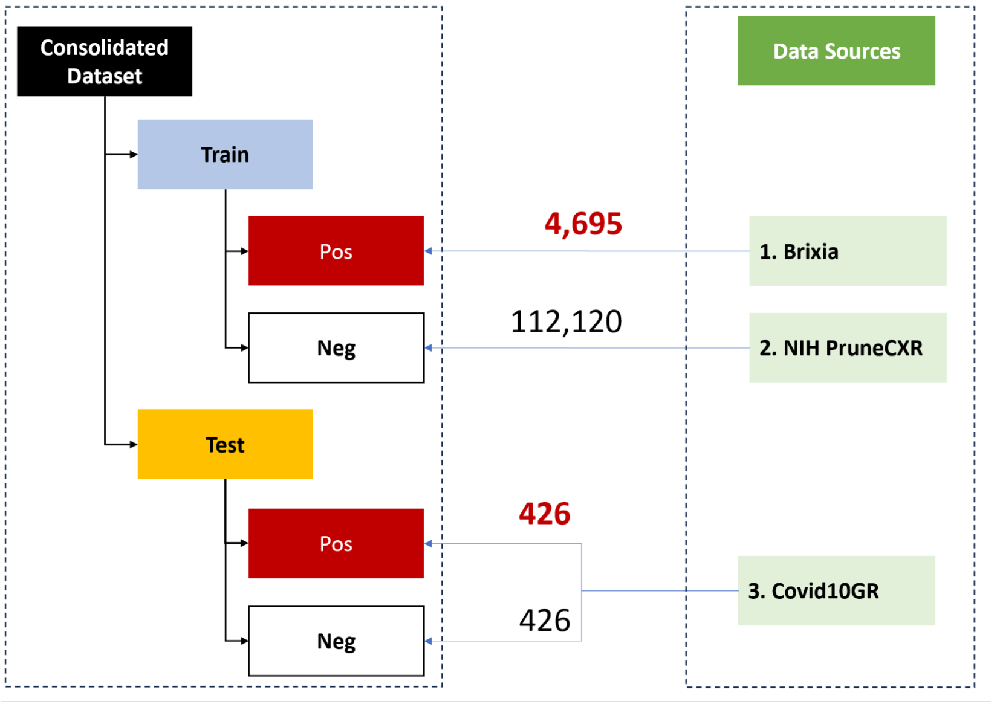

<a id="part3"></a>

## **3. Data Processing**

In [85]:
# Display the folder structure on the Original dataset
def print_folder_structure(path, indent=0):
    for item in os.listdir(path):
        item_path = os.path.join(path, item)
        if os.path.isdir(item_path):
            print('    ' * indent + item + '/')
            print_folder_structure(item_path, indent + 1)
            
print_folder_structure('original_data')

PruneCXR_IMG/
COVIDGR_1.0/
    P/
    N/
Brixia/


<a id="part4"></a>

### **3.1. Process the Data into Training and Testing Sets**


In [86]:
# We will set the  images size to 512x512 for train test and validation
Image_H = 512
Image_W = 512

In [87]:
# We copy all files in 'N' to dataset/test/N and all files in 'P' to dataset/test/P
def resize_images(source_dir, dest_dir, size=(Image_H, Image_W)):
    """
    Resize all .jpg files in the source directory to the specified size and save them to the destination directory.
    """
    # Create the destination directory if it does not exist
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)

    for filename in os.listdir(source_dir):
        if filename.lower().endswith('.jpg') or filename.lower().endswith('.png'):
            # Define the source and destination file paths            
            if filename.lower().endswith('.jpg'):
                source_path = os.path.join(source_dir, filename)
                dest_path = os.path.join(dest_dir, filename.replace('.jpg', '.png'))
            else:
                source_path = os.path.join(source_dir, filename)
                dest_path = os.path.join(dest_dir, filename)

            # Read the image from file
            image = cv2.imread(source_path)
            
            # Resize the image
            resized_image = cv2.resize(image, size)

            # Save the resized image to the destination path
            cv2.imwrite(dest_path, resized_image)
            print(f"Copied and Resize {source_path} to {dest_dir}")

In [ ]:
# We firstly process the files from COVIDGR_1.0 dataset
# This dataset contains 426 COVID-19 positive cases and 426 COVID-19 negative cases 

path_to_positive = 'original_data/COVIDGR_1.0/P'
path_to_negative = 'original_data/COVIDGR_1.0/N'

# Resize all files in 'N' to dataset/test/N
dest_dir_N = 'dataset/test/N'
resize_images(path_to_negative, dest_dir_N)

# Resize all files in 'P' to dataset/test/P
dest_dir_P = 'dataset/test/P'
resize_images(path_to_positive, dest_dir_P)

In [89]:
# The Original dataset has dcm format with different size, we will convert it to png format and resize it to 512x512
# Convert DICOM to PNG and Resize Images
def resize_dcm_image(dcm_path, dest_path, size=(Image_H, Image_W)):
    try:
        dcm = pydicom.dcmread(dcm_path)
        
        image = dcm.pixel_array.astype(float)
        
        # Normalize the pixel values and invert if the photometric interpretation is MONOCHROME1
        if dcm.PhotometricInterpretation == "MONOCHROME1":
            image = np.max(image) - image + np.min(image)
            dcm.PhotometricInterpretation = "MONOCHROME2"

        image = image - np.min(image)  # Shift the scale to start at zero
        image /= np.max(image) 
        
        image *= 255.0  # Scale to 255
        image = image.astype(np.uint8)  # Convert to uint8
        
        resized_image = cv2.resize(image, size, interpolation=cv2.INTER_AREA)
        
        cv2.imwrite(dest_path, resized_image)
        print(f"Copied resized file from {dcm_path} to {dest_path}")
    except Exception as e:
        print(f"An error occurred: {e}")


In [ ]:
# Copy and resize all files in 'P' to dataset/train/P
source_dir_P = 'original_data/Brixia'
dest_dir_P = 'dataset/train/P'

if not os.path.exists(dest_dir_P):
    os.makedirs(dest_dir_P)

for filename in os.listdir(source_dir_P):
    if filename.endswith('.dcm'):
        # Define the source and destination paths
        source_path = os.path.join(source_dir_P, filename)
        # Change the extension to .jpeg or .png as required
        dest_path = os.path.join(dest_dir_P, filename.replace('.dcm', '.png'))
        
        # Resize and save the image
        resize_dcm_image(source_path, dest_path)

In [ ]:
# Save all the images in PruneCXR_IMG folder to dataset/train/N
path_to_negative = 'original_data/PruneCXR_IMG/'
dest_dir_N = 'dataset/train/N'

resize_images(path_to_negative, dest_dir_N)

In [ ]:
print_folder_structure('dataset')

train/
    P/
    N/
test/
    P/
    N/


In [ ]:
# Check the number of files in each folder if they are equal with original dataset
def count_files(path):
    count = 0
    for root, dirs, files in os.walk(path):
        count += len(files)
    return count

print(f"Number of files in original_data/COVIDGR_1.0/P: {count_files('original_data/COVIDGR_1.0/P')}")
print(f"Number of files in dataset/test/P: {count_files('dataset/test/P')}\n")

print(f"Number of files in original_data/COVIDGR_1.0/N: {count_files('original_data/COVIDGR_1.0/N')}")
print(f"Number of files in dataset/test/N: {count_files('dataset/test/N')}\n")

print(f"Number of files in original_data/Brixia: {count_files('original_data/Brixia')}")
print(f"Number of files in dataset/train/P: {count_files('dataset/train/P')}\n")

print(f"Number of files in original_data/PruneCXR_IMG: {count_files('original_data/PruneCXR_IMG')}")
print(f"Number of files in dataset/train/N: {count_files('dataset/train/N')}\n")

Number of files in original_data/COVIDGR_1.0/P: 426
Number of files in dataset/test/P: 426

Number of files in original_data/COVIDGR_1.0/N: 426
Number of files in dataset/test/N: 426

Number of files in original_data/Brixia: 4695
Number of files in dataset/train/P: 4695

Number of files in original_data/PruneCXR_IMG: 112120
Number of files in dataset/train/N: 112120



<a id="part5"></a>
### **3.2. Image Classification**

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">

We handled image classification based on a CSV file provided from the original data website, the CSV file typically contains metadata about the images, such as where files from, labels, and possibly additional information like patient demographics or medical details.

</div>



In [ ]:
brixia_df = pd.read_csv("metadata_global_v2.csv", sep=";")
brixia_df.head()

,Filename,StudyDate,Modality,Columns,Rows,Manufacturer,PhotometricInterpretation,BrixiaScore,BrixiaScoreGlobal,ConsensusTestset,Subject,StudyId,Sex,AgeAtStudyDateFiveYear
0,15626316918619298757.dcm,20200403,CR,2802,2801,SIEMENS,MONOCHROME2,1,1,1,P2255,A0000,M,11
1,14564261561865340756.dcm,20200406,CR,2868,2320,Agfa,MONOCHROME1,2,2,1,P2291,A0001,M,8
2,3030367955559789319.dcm,20200405,CR,2866,2350,SIEMENS,MONOCHROME2,10,1,1,P2272,A0002,M,11
3,10548672632742803246.dcm,20200408,DX,3032,2520,CARESTREAM HEALTH,MONOCHROME1,21,3,1,P2299,A0003,M,12
4,434139174381164494.dcm,20200409,DX,3032,2520,CARESTREAM HEALTH,MONOCHROME1,1001,2,1,P2076,A0004,M,8


In [ ]:
# We notice that the Modality column contains the type of image, we will filter the CR and DX images
brixia_df_cr = brixia_df[brixia_df["Modality"] == "CR"]
brixia_df_dx = brixia_df[brixia_df["Modality"] == "DX"]

brixia_df_cr.head(10)

,Filename,StudyDate,Modality,Columns,Rows,Manufacturer,PhotometricInterpretation,BrixiaScore,BrixiaScoreGlobal,ConsensusTestset,Subject,StudyId,Sex,AgeAtStudyDateFiveYear
0,15626316918619298757.dcm,20200403,CR,2802,2801,SIEMENS,MONOCHROME2,1,1,1,P2255,A0000,M,11
1,14564261561865340756.dcm,20200406,CR,2868,2320,Agfa,MONOCHROME1,2,2,1,P2291,A0001,M,8
2,3030367955559789319.dcm,20200405,CR,2866,2350,SIEMENS,MONOCHROME2,10,1,1,P2272,A0002,M,11
5,354804998861725523.dcm,20200409,CR,2866,2350,SIEMENS,MONOCHROME2,1001,2,1,P2297,A0005,M,15
6,3561567349658758431.dcm,20200403,CR,2868,2320,Agfa,MONOCHROME1,1001,2,1,P2321,A0006,M,10
7,4927439592595712537.dcm,20200409,CR,2866,2350,SIEMENS,MONOCHROME2,1011,3,1,P0018,A0007,M,10
12,9831162879402727847.dcm,20200406,CR,2866,2350,SIEMENS,MONOCHROME2,2001,3,1,P2201,A0012,M,16
14,18217665447515990416.dcm,20200403,CR,2866,2350,SIEMENS,MONOCHROME2,10000,1,1,P2252,A0014,M,6
15,685184408314692298.dcm,20200403,CR,2866,2350,SIEMENS,MONOCHROME2,10001,2,1,P2292,A0015,M,10
18,11144427466904541752.dcm,20200408,CR,2828,2320,Agfa-Gevaert,MONOCHROME1,11001,3,1,P2324,A0018,M,10


In [ ]:
# We will create a function to change the filename from .dcm to .png 
# This is because the images in the dataset are in .png format and not .dcm

# change string "file.dcm" to "file.png"
def change_filename(string):
    return string.replace(".dcm", ".png")

# select all the Filename of the images from the dataset/P directory and save results in another floder dataset/P_CR
def copy_files(df, orig_path, dest_path):
    for i in range(len(df)):
        shutil.copy(os.path.join(orig_path, change_filename(df.iloc[i]["Filename"])), os.path.join(dest_path, change_filename(df.iloc[i]["Filename"])))

try:
    #if the directory does not exist, create it
    if not os.path.exists("datasetclassify/train/P/P_CR") or not os.path.exists("datasetclassify/train/P/P_DX"):
        os.mkdir("datasetclassify/train/P/P_CR")
        os.mkdir("datasetclassify/train/P/P_DX")
    copy_files(brixia_df_cr, "dataset/train/P", "datasetclassify/train/P/P_CR")
    copy_files(brixia_df_dx, "dataset/train/P", "datasetclassify/train/P/P_DX")
    
except:
    print("Error while creating the directory")

In [ ]:
def preprocess_image_ocr(image_path):
    # Load the image using cv2
    img = cv2.imread(image_path)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply thresholding
    _, thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV)
    
    # Resize the image to increase the size of the text
    resized = cv2.resize(thresh, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR)
    
    # Convert back to PIL Image format to use with pytesseract
    return Image.fromarray(resized)

In [ ]:
# We notice that all the images with AP view contain the string "AP", A.P .. in the image
def contains_ap(image_path):
    img = preprocess_image_ocr(image_path)
    text = pytesseract.image_to_string(img)
    
    # Check if the OCR'd text contains 'AP', 'A.P', or 'A.P. then return True
    return 'AP' in text.upper() or 'A.P' in text.upper() or 'A.P.' in text.upper()  
    # Check if 'AP' is in the OCR'd text

In [ ]:
# Save all if the image contains AP projection
ap_images = []
image_path = 'datasetclassify/train/P/P_CR/'
for filename in os.listdir(image_path):
    if contains_ap(image_path + filename):
        ap_images.append(image_path + filename)
        print(f"{filename} in AP projection")

In [ ]:
# move the rest of the images to a new folder dataset/train/P_CR_PA
try:
    if not os.path.exists("datasetclassify/train/P/P_CR_PA"):
        os.mkdir("datasetclassify/train/P/P_CR_PA")
    for image in os.listdir("datasetclassify/train/P/P_CR"):
        shutil.move(os.path.join("datasetclassify/train/P/P_CR", image), "datasetclassify/train/P/P_CR_PA")
except:
    print("Error while creating the directory")

In [ ]:
dx_ap_images = []
image_path = 'datasetclassify/train/P/P_DX/'
for filename in os.listdir(image_path):
    if contains_ap(image_path + filename):
        dx_ap_images.append(image_path + filename)
        print(f"{filename} in AP projection")

In [ ]:
# move the images that contain the word 'AP' to a new folder
try:
    if not os.path.exists("datasetclassify/train/P/P_DX_AP"):
        os.mkdir("datasetclassify/train/P/P/P_DX_AP")
    for image in dx_ap_images:
        shutil.move(image, "datasetclassify/train/P/P_DX_AP")
except:
    print("Error while creating the directory")

In [ ]:
# move the rest of the images to a new folder dataset/train/P_DX_PA
try:
    if not os.path.exists("datasetclassify/train/P/P_DX_PA"):
        os.mkdir("datasetclassify/train/P/P_DX_PA")
    for image in os.listdir("datasetclassify/train/P/P_DX"):
        shutil.move(os.path.join("datasetclassify/train/P/P_DX", image), "datasetclassify/train/P/P_DX_PA")
except:
    print("Error while creating the directory")

In [ ]:
# We now start to process the training negative cases
# We will use the PruneCXR dataset to get the negative cases with the labels
PruneCXR_train_df = pd.read_csv('PruneCXR/miccai2023_nih-cxr-lt_labels_train.csv')
PruneCXR_test_df = pd.read_csv('PruneCXR/miccai2023_nih-cxr-lt_labels_test.csv')
PruneCXR_val_df = pd.read_csv('PruneCXR/miccai2023_nih-cxr-lt_labels_val.csv')

temp_df = pd.DataFrame()
#combine the train, test and validation dataframes
temp_df = pd.concat([PruneCXR_train_df, PruneCXR_test_df, PruneCXR_val_df], ignore_index=True)

temp_df

In [ ]:
# the labels are the name of column,

# print column names of the temp_df
print(temp_df.columns[1:-1])

Index(['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion',
       'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule',
       'Pleural Thickening', 'Pneumonia', 'Pneumothorax', 'Pneumoperitoneum',
       'Pneumomediastinum', 'Subcutaneous Emphysema', 'Tortuous Aorta',
       'Calcification of the Aorta', 'No Finding'],
      dtype='object')


In [ ]:
# move the images from 'datasetclassify/train/N to 'datasetclassify/train/N/N_{finding}'
for row in range(len(temp_df)):
    #check which column has the value 1, then move the image to the corresponding folder
    for name in temp_df.columns[1:-1]:
        if temp_df.iloc[row][name] == 1:
            try:
                # skip is the image is not found or if the image is already exists
                shutil.move(f"datasetclassify/train/N/{temp_df.iloc[row]['id']}", f"datasetclassify/train/N/N_{name.replace(' ', '_').lower()}")
                print(f"Moved {temp_df.iloc[row]['id']} to N_{name.replace(' ', '_').lower()}")
            except:
                pass

In [ ]:
# check the number of files in each folder
sum = 0 
for folder in os.listdir("datasetclassify/train/N"):
    length = len(os.listdir(f"datasetclassify/train/N/{folder}"))
    print(f"Number of images in {folder}: {length}")
    sum += length

print(f"Total number of images: {sum}")
# the total number of images should be equal to the number of images in the PruneCXR dataset

Number of images in N_fibrosis: 1215
Number of images in N_nodule: 3002
Number of images in N_mass: 2927
Number of images in N_pneumoperitoneum: 129
Number of images in N_cardiomegaly: 2406
Number of images in N_infiltration: 11794
Number of images in N_calcification_of_the_aorta: 200
Number of images in N_pneumomediastinum: 65
Number of images in N_pneumothorax: 2194
Number of images in N_subcutaneous_emphysema: 88
Number of images in N_pleural_thickening: 1216
Number of images in N_tortuous_aorta: 473
Number of images in N_no_finding: 59406
Number of images in N_atelectasis: 11559
Number of images in N_hernia: 156
Number of images in N_edema: 1862
Number of images in N_effusion: 8038
Number of images in N_emphysema: 1733
Number of images in N_consolidation: 3330
Number of images in N_pneumonia: 327
Total number of images: 112120


In [ ]:
# Display the folder structure on the Original dataset
print_folder_structure('datasetclassify')

train/
    P/
        P_DX_AP/
        P_DX_PA/
        P_CR_AP/
        P_CR_PA/
    N/
        N_fibrosis/
        N_nodule/
        N_mass/
        N_pneumoperitoneum/
        N_cardiomegaly/
        N_infiltration/
        N_calcification_of_the_aorta/
        N_pneumomediastinum/
        N_pneumothorax/
        N_subcutaneous_emphysema/
        N_pleural_thickening/
        N_tortuous_aorta/
        N_no_finding/
        N_atelectasis/
        N_hernia/
        N_edema/
        N_effusion/
        N_emphysema/
        N_consolidation/
        N_pneumonia/
test/
    P/
        P_DX_AP/
        P_DX_PA/
        P_CR_AP/
        P_CR_PA/
    N/
        N_fibrosis/
        N_nodule/
        N_mass/
        N_pneumoperitoneum/
        N_cardiomegaly/
        N_infiltration/
        N_calcification_of_the_aorta/
        N_pneumomediastinum/
        N_pneumothorax/
        N_subcutaneous_emphysema/
        N_pleural_thickening/
        N_tortuous_aorta/
        N_no_finding/
        N_at

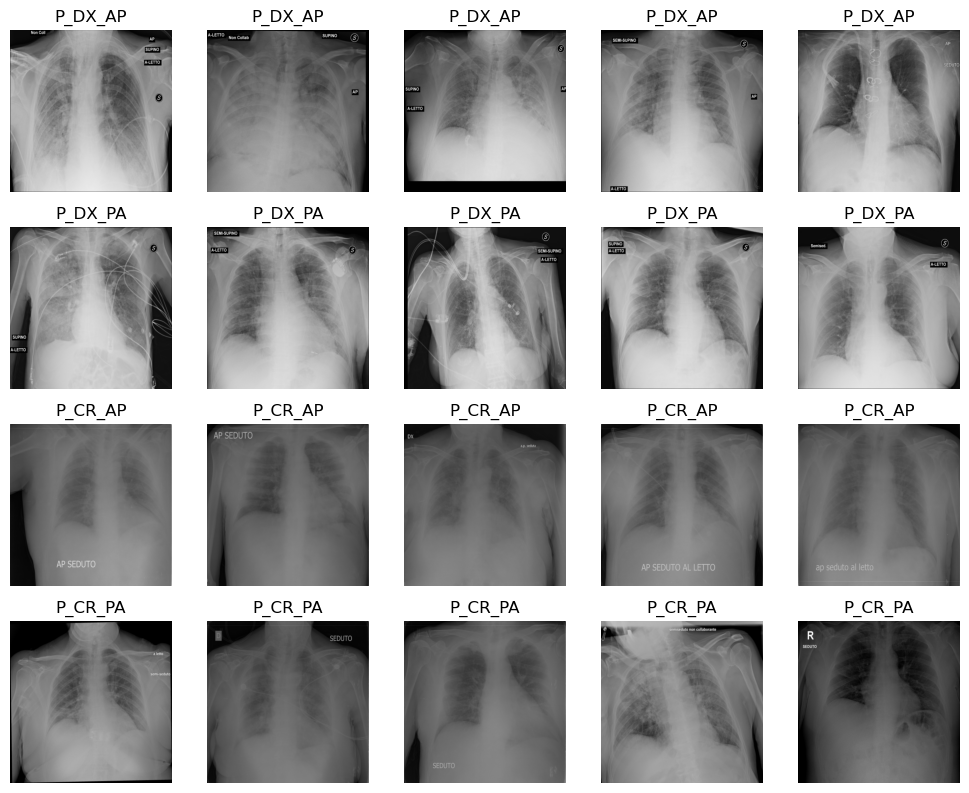

In [ ]:
# display sample images from the datasetclassify/train/P/
fig = plt.figure(figsize=(10, 10))
for folder in os.listdir("datasetclassify/train/P"):
    for i, image in enumerate(os.listdir(f"datasetclassify/train/P/{folder}")[0:5]):
        img = cv2.imread(f"datasetclassify/train/P/{folder}/{image}")        
        ax = fig.add_subplot(5, 5, 5 * list(os.listdir("datasetclassify/train/P")).index(folder) + i + 1)
        ax.set_title(folder)
        plt.imshow(img)
        plt.axis("off") 
        
# Show the plot
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

<Figure size 1600x1000 with 0 Axes>

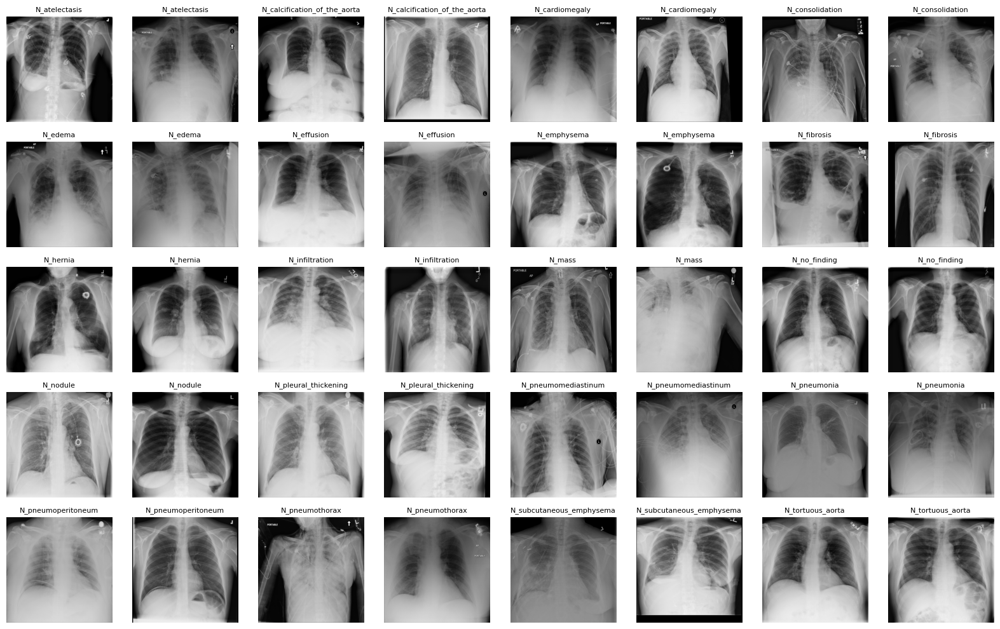

In [ ]:
# display sample images from the datasetclassify/train/N/
fig = plt.figure(figsize=(16, 10))
base_path = "datasetclassify/train/N"
# Determine the number of subfolders
folders = sorted(os.listdir(base_path))
num_folders = len(folders)
images_per_folder = 2

num_columns = (num_folders * images_per_folder) // 5
if (num_folders * images_per_folder) % 5 != 0:
    num_columns += 1 

# Initialize the figure with a dynamic size
fig = plt.figure(figsize=(2 * num_columns, 2 * 5))
# Loop through each folder in the directory
for idx, folder in enumerate(sorted(os.listdir(base_path))):
    folder_path = os.path.join(base_path, folder)
    # radomly select 2 images from each folder
    images = random.sample(os.listdir(folder_path), 2) 
    
    # Display each image in the subplot
    for i, image in enumerate(images):
        img_path = os.path.join(folder_path, image)
        img = cv2.imread(img_path)
        if img is None:
            continue  # Skip if the image can't be loaded
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

        # Calculate subplot index
        subplot_index = idx * images_per_folder + i + 1
        ax = fig.add_subplot(5, num_columns, subplot_index)  # 5 rows and dynamic number of columns
        ax.imshow(img)
        ax.axis("off")  # Hide axes
        ax.set_title(f"{folder}", fontsize=8)

# Show the plot
plt.tight_layout()
plt.show()

<a id="part6"></a>
### **3.3. Image Augmentation**

In [ ]:
# We will now create a function to augument the images
def preprocess_image(image):
    '''
    return tf.cast(image, tf.float32)
    '''
    # Create a CLAHE object with desired clip limit and tile grid size
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))  # Adjust these parameters as needed
    
    # The input image should be a float32 numpy array 
    # Convert the image to uint8, since CLAHE requires uint8 input
    image_uint8 = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    
    if len(image.shape) == 2:
        # Apply CLAHE to the grayscale image
        image_clahe = clahe.apply(image_uint8)
        
    elif len(image.shape) == 3 and image.shape[2] == 1:
        # If the image has a single color channel, apply CLAHE on that channel
        image_clahe = clahe.apply(image_uint8.squeeze())
        # Expand dimensions back after applying CLAHE
        image_clahe = np.expand_dims(image_clahe, axis=-1)
        
    else:
        # If the image is colored (RGB), convert to YUV, apply CLAHE on the Y channel, then convert back to RGB
        image_yuv = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2YUV)
        image_yuv[:, :, 0] = clahe.apply(image_yuv[:, :, 0])
        image_clahe = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)
    
    # Convert the result back to float32 and normalize to [0, 1] range for further processing if needed
    image_clahe = image_clahe.astype('float32')
    
    return image_clahe


In [ ]:
# Initialize the data generators
datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.02, 
    height_shift_range=0.02,
    zoom_range=0.05,
    horizontal_flip=False,  # Keep it False for X-rays
    fill_mode='nearest',
    brightness_range=(0.7, 1.3),  
    preprocessing_function=preprocess_image, 
    validation_split=0.3
)

In [ ]:
# Split the data into training and testing sets
binary_train_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    color_mode="grayscale",
    subset='training', 
    shuffle=True, 
)

binary_validation_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    color_mode="grayscale",
    subset='validation', # Specify this is validation data
    shuffle=False, 
)

Found 81771 images belonging to 2 classes.
Found 35044 images belonging to 2 classes.


In [ ]:
categories_train_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='categorical',
    color_mode="grayscale",
    subset='training', 
    shuffle=True, 
)

categories_validation_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='categorical',
    color_mode="grayscale",
    subset='validation', # Specify this is validation data
    shuffle=False, 
)

Found 81771 images belonging to 2 classes.
Found 35044 images belonging to 2 classes.


<a id="part7"></a>
### **3.4. Data Summary**

In [ ]:
# Summary of the Data Generators
def summaryoftrainvaldata(train_generator, validation_generator):
    # Display the class indices
    train_data = {
        "Type": ["Training"],
        "Class Indices": [train_generator.class_indices],
        "Classes": [len(train_generator.class_indices)],  # Changed to class_indices to get the number of classes
        "Image Shape": [train_generator.image_shape],
        "Samples": [train_generator.samples]
    }

    validation_data = {
        "Type": ["Validation"],
        "Class Indices": [validation_generator.class_indices],
        "Classes": [len(validation_generator.class_indices)],  # Changed to class_indices to get the number of classes
        "Image Shape": [validation_generator.image_shape],
        "Samples": [validation_generator.samples]
    }

    # Create DataFrames
    train_df = pd.DataFrame(train_data)
    validation_df = pd.DataFrame(validation_data)

    # Combine both DataFrames into one for display
    combined_df = pd.concat([train_df, validation_df]).reset_index(drop=True)

    # Display the combined DataFrame
    print("Combined Training and Validation Data:")
    display(combined_df)

In [ ]:
summaryoftrainvaldata(binary_train_generator, binary_validation_generator)
summaryoftrainvaldata(categories_train_generator, categories_validation_generator)

Combined Training and Validation Data:


,Type,Class Indices,Classes,Image Shape,Samples
0,Training,"{'N': 0, 'P': 1}",2,"(512, 512, 1)",81771
1,Validation,"{'N': 0, 'P': 1}",2,"(512, 512, 1)",35044


Combined Training and Validation Data:


,Type,Class Indices,Classes,Image Shape,Samples
0,Training,"{'N': 0, 'P': 1}",2,"(512, 512, 1)",81771
1,Validation,"{'N': 0, 'P': 1}",2,"(512, 512, 1)",35044


In [ ]:
def plot_images(images_arr, labels, rows=4):
    # Calculate the number of columns by dividing the total number of images by the number of rows
    cols = len(images_arr) // rows
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()
        
    for img, ax, label in zip(images_arr, axes, labels):
        if img.ndim == 3 and img.shape[2] == 1:
            # If image is grayscale, reshape it for display
            img = img.reshape(img.shape[0], img.shape[1])
        ax.imshow(img, cmap='gray')  # Use the 'gray' colormap for grayscale images
        ax.axis('off')
        ax.set_title(f"Label: {label}")

    plt.tight_layout()
    plt.show()

In [ ]:
# Fetch a batch of images and their labels
def fetchimages (train_generator):
    images, labels = next(train_generator)
    # Since the labels might be in binary (0 or 1) or one-hot encoded format, adjust the title accordingly
    # If labels are binary or single class per image, you can directly pass them; otherwise, you may need to adjust:
    if train_generator.class_mode == 'binary':
        label_names = [f'P' if label else 'N' for label in labels]
    elif train_generator.class_mode == 'categorical':
        # Convert one-hot encoded labels back to class indices, then to class names if needed
        label_indices = labels.argmax(axis=1)
        keys_list = list(train_generator.class_indices.keys())
        label_names = [keys_list[index] for index in label_indices]
    else:
        label_names = [str(label) for label in labels]

    # Now, plot the images with their labels
    plot_images(images, label_names)

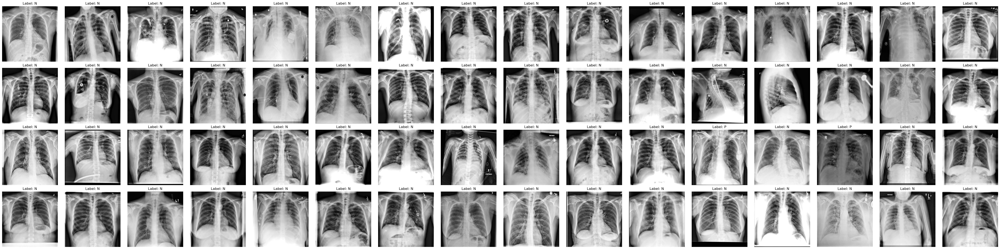

In [ ]:
# data is ready for training
fetchimages(binary_train_generator)

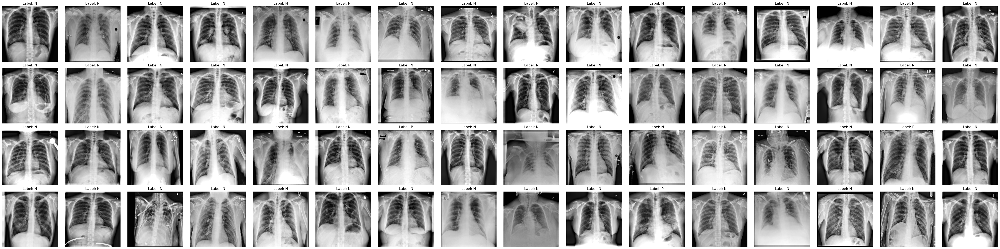

In [ ]:
# data is ready for training
fetchimages(categories_train_generator)

<a id="part8"></a>
### **3.5. Class Weights**

In [ ]:
binary_train_generator.class_indices

{'N': 0, 'P': 1}

In [ ]:
categories_train_generator.class_indices

{'N': 0, 'P': 1}

In [91]:
def class_weights_cal(base_dir, train_generator):
    # Initialize a dictionary to hold the count of images per class
    class_image_counts = {}

    # Traverse the directory structure
    for main_category in os.listdir(base_dir):  # 'P' and 'N' directories
        main_category_path = os.path.join(base_dir, main_category)
        if os.path.isdir(main_category_path):  # Ensure it's a directory
            for sub_class in os.listdir(main_category_path):
                sub_class_path = os.path.join(main_category_path, sub_class)
                if os.path.isdir(sub_class_path):  # Ensure it's a directory
                    images = [img for img in os.listdir(sub_class_path) if img.endswith(('png', 'jpg', 'jpeg'))]
                    class_image_counts[sub_class] = len(images)
                    
    # Filter out classes with zero images for computing class weights
    valid_classes = {k: v for k, v in class_image_counts.items() if v > 0}
    labels = [class_name for class_name in sorted(valid_classes.keys())]
    counts = [valid_classes[label] for label in labels]

    # Calculate class weights
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(labels),
        y=np.repeat(labels, counts)
    )
    
    # Map computed weights to the corresponding class indices in the train_generator
    p_weights = [weight for label, weight in zip(labels, class_weights) if 'P_' in label]
    n_weights = [weight for label, weight in zip(labels, class_weights) if 'N_' in label]

    aggregated_weights = {
        'P': np.mean(p_weights),
        'N': np.mean(n_weights)
    }

    class_weight_dict = {train_generator.class_indices['P']: aggregated_weights['P'],
                         train_generator.class_indices['N']: aggregated_weights['N']}
    
    return class_weight_dict

In [92]:
binary_class_weights = class_weights_cal('datasetclassify/train', binary_train_generator)
categories_class_weights = class_weights_cal('datasetclassify/train', categories_train_generator)

binary_class_weights, categories_class_weights


({1: 252.537319495651, 0: 13.628717956111666},
 {1: 252.537319495651, 0: 13.628717956111666})

The model will treat a single sample of class P as roughly 24 times more significant than a single sample of class N during training. 
This is to counteract the fact that P samples are much less frequent, thus helping to prevent the model from being biased towards the more frequent class N.

In [93]:
# The class weights are calculated based on the number of images in each class
Total_N = count_files('dataset/train/N')
Total_P = count_files('dataset/train/P')

class_labels = np.array([0 for _ in range(Total_N)] + [1 for _ in range(Total_P)])
class_weights = compute_class_weight('balanced', classes=np.unique(class_labels), y=class_labels)
class_weight_dict = {0: class_weights[0], 1: class_weights[1]}

print("Recalculated class weights:", class_weight_dict)

Recalculated class weights: {0: 0.5209373885123082, 1: 12.440362087326944}


The class weights {0: 0.5209373885123082, 1: 12.440362087326944} are addressed the significant imbalance between the two classes in our dataset, where class 'N' (0) is more frequent, and class 'P' (1) is less frequent. In the next Steps we will apply techniques like cross-validation to help assess how these weights perform across different subsets of our data.


<a id="part8"></a>
### **3.6. Attempt on Pixel Distribution Shifting**
The following picture demonstarted our work on shifiting the pixel distributions so the images are more uniform among each other and extrat key information. It could be beneficial for training and group members to psychologically understand the patterns of COVID19. However, due to time and computational power limitation, we have not yet found a satisfactory method to tune all the images. 

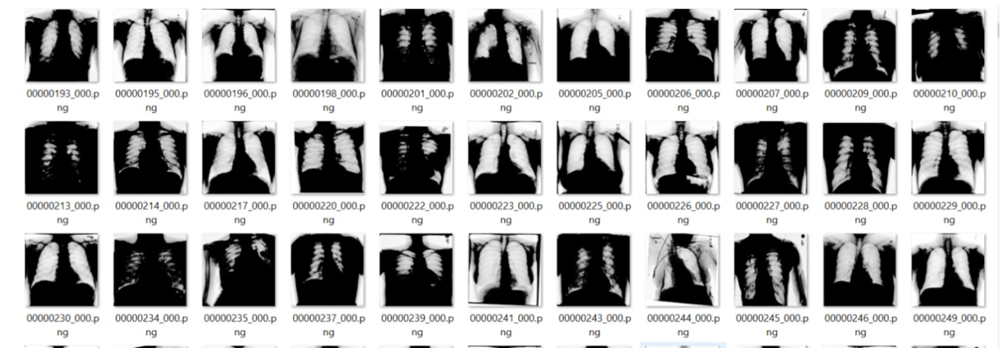

<a id="part9"></a>

## **4. Model Build**

<a id="part10"></a>

### **4.1. CNN Model**

In [94]:
def CNN_model(num_classes, model_activation, model_name):
    nodes = 512
    activation='relu'
    dropout_convs = 0.3
    dropout_dense = 0.5
    kernel_regularizer = 0.001
    bias_regularizer = 0.001

    model = tf.keras.models.Sequential([
        # Convolutional Layer 1
        tf.keras.layers.Conv2D(16, (3, 3), activation=activation, padding='same', input_shape=(Image_H, Image_W, 1)),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Dropout(dropout_convs),

        # Convolutional Layer 2
        tf.keras.layers.Conv2D(32, (3, 3), activation=activation, padding='same'),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Dropout(dropout_convs),

        # Convolutional Layer 3
        tf.keras.layers.Conv2D(64, (3, 3), activation=activation, padding='same'),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Dropout(dropout_convs),
        
        tf.keras.layers.Conv2D(64, (3, 3), activation=None, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation(activation),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Dropout(dropout_convs),
        
        # Flatten the output of the convolutions
        tf.keras.layers.Flatten(),    
        
        # Fully Connected Layer
        tf.keras.layers.Dense(nodes, activation=activation, 
        kernel_regularizer=tf.keras.regularizers.l2(kernel_regularizer), 
        bias_regularizer=tf.keras.regularizers.l2(bias_regularizer)),
        tf.keras.layers.Dropout(dropout_dense),
                
        tf.keras.layers.Dense(num_classes, activation=model_activation) 
    ], name = model_name)
    
    return model

In [95]:
CNN_binary_model = CNN_model(1, 'sigmoid', 'CNN_Binary_Model')

In [96]:
CNN_categories_model = CNN_model(2, 'softmax', 'CNN_Categories_Model')

In [97]:
# build NN with regularization
learning_rate = 1e-5
beta_1, beta_2 = 0.9, 0.999
epsilon = 1e-7
amsgrad = False

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2, epsilon=epsilon, amsgrad=amsgrad)

# Focal Loss for Imbalanced Classification Problems
categories_focal_loss = tfa.losses.SigmoidFocalCrossEntropy(reduction=tf.keras.losses.Reduction.AUTO, from_logits=False)
binary_focal_loss = tfa.losses.SigmoidFocalCrossEntropy(reduction=tf.keras.losses.Reduction.AUTO, from_logits=False)

metrics = [
    'accuracy',
    tf.keras.metrics.Precision(name='precision'),
    tf.keras.metrics.Recall(name='recall'), 
    tf.keras.metrics.AUC(name='auc'),
    tf.keras.metrics.TruePositives(name='tp'),
    tf.keras.metrics.TrueNegatives(name='tn'),
]

In [ ]:
CNN_binary_model.compile(optimizer=optimizer,
                         loss=binary_focal_loss,
                         metrics= metrics)

CNN_binary_model.summary()

Model: "CNN_Binary_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 512, 512, 16)      160       
                                                                 
 max_pooling2d (MaxPooling2  (None, 256, 256, 16)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 256, 256, 16)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 128, 128, 32)      0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 128, 128, 32) 

In [ ]:
CNN_categories_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
                                loss=categories_focal_loss,
                                metrics= metrics)

CNN_categories_model.summary()

Model: "CNN_Categories_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 512, 512, 16)      160       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 256, 256, 16)      0         
 g2D)                                                            
                                                                 
 dropout_5 (Dropout)         (None, 256, 256, 16)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 256, 256, 32)      4640      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 128, 128, 32)      0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 128, 128, 

In [98]:
def model_fit(train_generator, validation_generator, model, class_weights, h5name, epochs=10):
    # Enable EarlyStopping and ModelCheckpoint
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, mode='max') 
    verbose = 1
    
    # Create a ModelCheckpoint callback
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        h5name,
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        verbose=1, 
        mode='max'
    )

    history = model.fit(
        train_generator,
        steps_per_epoch= train_generator.samples // (train_generator.batch_size*16),
        epochs=epochs,
        validation_data=validation_generator,
        validation_steps=validation_generator.samples // (validation_generator.batch_size*16),
        class_weight=class_weights,
        verbose=verbose, 
        callbacks=[es, checkpoint]
    )
    return history

In [ ]:
# Fit the model
# Enable EarlyStopping and ModelCheckpoint
h5name = 'CNN_binary_model.h5'
CNN_binary_history = model_fit(binary_train_generator, binary_validation_generator, CNN_binary_model, class_weight_dict, h5name, epochs=30)

Epoch 1/30


2024-05-08 05:17:36.334314: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Binary_Model/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-05-08 05:17:37.260817: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-05-08 05:17:39.474377: I external/local_xla/xla/service/service.cc:168] XLA service 0x7efdb0fdef20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-08 05:17:39.474401: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3090 Ti, Compute Capability 8.6
2024-05-08 05:17:39.478383: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1715159859.525099  970252 device_compiler.h:186] Compiled cluster

79/79 [==============================] - ETA: 0s - loss: 1.2786 - accuracy: 0.7698 - precision: 0.0563 - recall: 0.3020 - auc: 0.6049 - tp: 61.0000 - tn: 3831.0000
Epoch 1: val_accuracy improved from -inf to 0.01195, saving model to CNN_binary_model.h5
79/79 [==============================] - 80s 852ms/step - loss: 1.2786 - accuracy: 0.7698 - precision: 0.0563 - recall: 0.3020 - auc: 0.6049 - tp: 61.0000 - tn: 3831.0000 - val_loss: 1.1456 - val_accuracy: 0.0119 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.0000e+00 - val_tp: 0.0000e+00 - val_tn: 26.0000
Epoch 2/30
79/79 [==============================] - ETA: 0s - loss: 1.1218 - accuracy: 0.7700 - precision: 0.0841 - recall: 0.4241 - auc: 0.6817 - tp: 95.0000 - tn: 3798.0000
Epoch 2: val_accuracy did not improve from 0.01195
79/79 [==============================] - 78s 986ms/step - loss: 1.1218 - accuracy: 0.7700 - precision: 0.0841 - recall: 0.4241 - auc: 0.6817 - tp: 95.0000 - tn: 3798.0000 - val_loss: 1.1492 - va

In [ ]:
h5name = "CNN_categories_model.h5"
CNN_categories_history = model_fit(categories_train_generator, categories_validation_generator, CNN_categories_model, class_weight_dict, h5name, epochs=30)

Epoch 1/30


2024-05-08 05:30:28.769058: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Categories_Model/dropout_5/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - ETA: 0s - loss: 2.0984 - accuracy: 0.6576 - precision: 0.6576 - recall: 0.6576 - auc: 0.7217 - tp: 3325.0000 - tn: 3325.0000
Epoch 1: val_accuracy improved from -inf to 0.24219, saving model to CNN_categories_model.h5
79/79 [==============================] - 81s 1s/step - loss: 2.0984 - accuracy: 0.6576 - precision: 0.6576 - recall: 0.6576 - auc: 0.7217 - tp: 3325.0000 - tn: 3325.0000 - val_loss: 1.1884 - val_accuracy: 0.2422 - val_precision: 0.2422 - val_recall: 0.2422 - val_auc: 0.1671 - val_tp: 527.0000 - val_tn: 527.0000
Epoch 2/30
79/79 [==============================] - ETA: 0s - loss: 1.6993 - accuracy: 0.5957 - precision: 0.5957 - recall: 0.5957 - auc: 0.6207 - tp: 3012.0000 - tn: 3012.0000
Epoch 2: val_accuracy did not improve from 0.24219
79/79 [==============================] - 78s 988ms/step - loss: 1.6993 - accuracy: 0.5957 - precision: 0.5957 - recall: 0.5957 - auc: 0.6207 - tp: 3012.0000 - tn: 3012.0000 - val_loss: 1.2924 - val_ac

In [ ]:
# save the model
def save_model(model, model_path, history):
    if not os.path.exists('models'):
        os.makedirs('models')

    history_dict = history.history

    with open(model_path, "wb") as filehandler:
        pickle.dump(history_dict, filehandler)
        # save model weights for future use
        
    model.save_weights(model_path + '.ckpt')
    print(
        "\n...model weights and training history successfully "
        "saved to file.\n")

In [ ]:
save_model(CNN_binary_model, 'models/CNN_binary_model', CNN_binary_history)
save_model(CNN_categories_model, 'models/CNN_categories_model', CNN_categories_history)


...model weights and training history successfully saved to file.


...model weights and training history successfully saved to file.



In [99]:
# Print Best Epoch
def display_accuary(history, text):
    print(text)
    best_epoch = np.argmin(history.history['val_loss']) + 1
    print(f"Best epoch: {best_epoch}")

    print(f"Train accuracy: {history.history['accuracy'][best_epoch - 1]:.5f}")
    print(f"Validation accuracy: {history.history['val_accuracy'][best_epoch - 1]:.5f}")

    print(f"Train loss: {history.history['loss'][best_epoch - 1]:.5f}")
    print(f"Validation loss: {history.history['val_loss'][best_epoch - 1]:.5f}")

In [ ]:
# display the best epoch for CNN binary model
text = "############ CNN Binary Model ###########\n"
display_accuary(CNN_binary_history, text)

In [ ]:
# display the best epoch for CNN categories model
text = "############ CNN Categories Model ###########\n"
display_accuary(CNN_categories_history, text)

############ CNN Categories Model ###########

Best epoch: 1
Train accuracy: 0.65763
Validation accuracy: 0.24219
Train loss: 2.09839
Validation loss: 1.18843


In [101]:
# Plot the training loss and accuracy per epoch (both train and validation)
def plot_train_accuracy(history, text):
    plt.figure(figsize=(14, 5))
    # For accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # For loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.suptitle(text)
    plt.show()

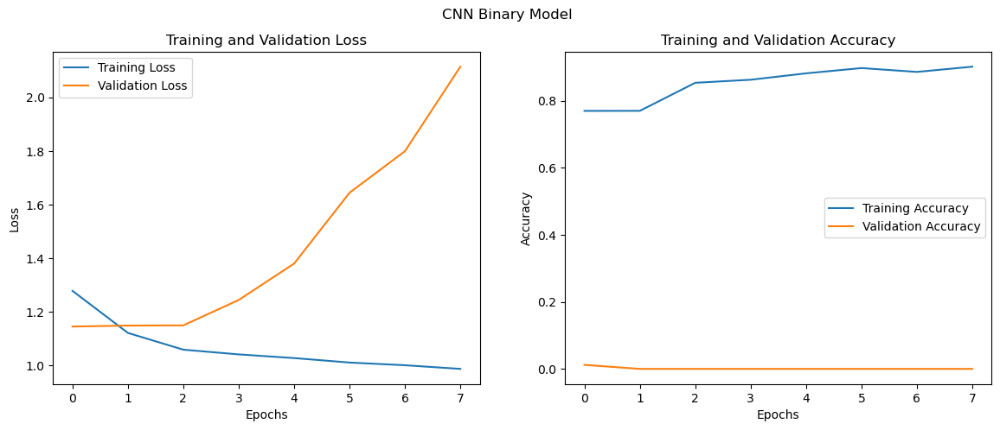

In [ ]:
# plot the training accuracy for CNN binary model
text = "CNN Binary Model"
plot_train_accuracy(CNN_binary_history, text)

The plots from the CNN Binary Model show diverging trends between training and validation performance over epochs, which can be a cause for concern. The training loss consistently decreases, indicating effective learning from the training data. Conversely, the validation loss steadily increases, suggesting that the model may be overfitting the training data and not generalizing well to unseen data. The accuracy plot amplifies this concern: while training accuracy improves and plateaus at a high level, validation accuracy remains static at a significantly lower level throughout the training process. This discrepancy between training and validation metrics, particularly the poor validation performance despite good training outcomes, underscores the need for implementing strategies to combat overfitting, such as introducing more regularization, adjusting the model's complexity, or improving the robustness of the training process through techniques like data augmentation or more sophisticated cross-validation methods.

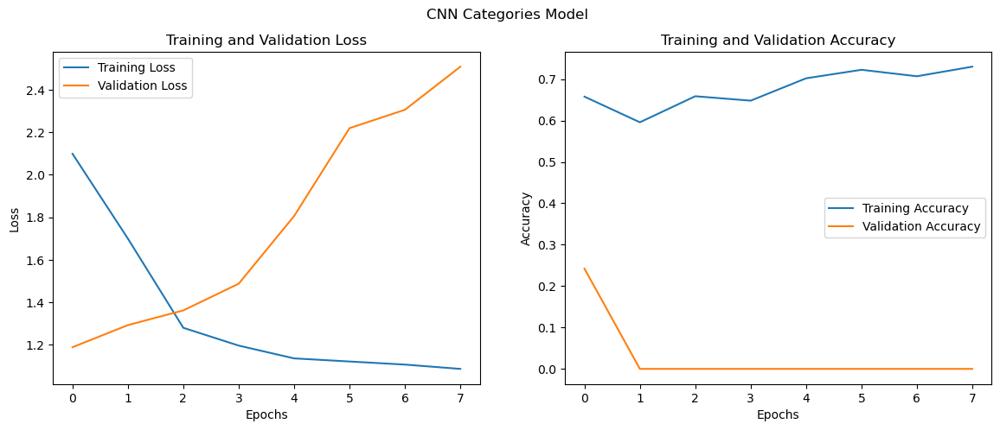

In [ ]:
#plot the training accuracy for CNN categories model
text = "CNN Categories Model"
plot_train_accuracy(CNN_categories_history, text)

The plots for the CNN Categories Model reveal significant issues related to model overfitting and inadequate validation performance. The training loss decreases sharply and then levels off, which is typically a good sign of learning. However, the validation loss initially decreases but then increases significantly, indicating that the model is not generalizing well beyond the training data. The stark contrast between the training accuracy, which appears relatively stable and moderately high, and the validation accuracy, which drastically plummets to nearly zero, underscores severe overfitting. This situation suggests that the model has learned to memorize the training data rather than learning to generalize from it. Adjustments such as incorporating dropout, applying more aggressive data augmentation, using regularization techniques, or collecting more diverse and representative validation data are necessary to address these issues and improve the model's robustness and general applicability.

In [130]:
# use test data to evaluate the model
test_datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.02,  # Use relative shift
    height_shift_range=0.02,
    zoom_range=0.05,
    horizontal_flip=False,  # Keep it False for X-rays
    fill_mode='reflect',
    brightness_range=(0.7, 1.3),  # Slightly adjusted for broader variation while ensuring realism
    preprocessing_function=preprocess_image,  # Apply custom preprocessing function
)

In [129]:
binary_text_generator = test_datagen.flow_from_directory(
    'dataset/test',
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    color_mode="grayscale",
    shuffle=False
)

Found 852 images belonging to 2 classes.


In [131]:
categories_test_generator = test_datagen.flow_from_directory(
    'datasetclassify/test',
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode= 'categorical',
    color_mode="grayscale",
    shuffle=False
)

Found 852 images belonging to 2 classes.


In [105]:
# Display the test data information
def summaryoftestdata(test_generator):
    test_data = {
        "Type": ["Test"],
        "Class Indices": [test_generator.class_indices],
        "Classes": [len(test_generator.class_indices)],  # Changed to class_indices to get the number of classes
        "Image Shape": [test_generator.image_shape],
        "Samples": [test_generator.samples]
    }

    test_df = pd.DataFrame(test_data)

    # Display the combined DataFrame
    print("Test Data:")
    display(test_df)

In [ ]:
summaryoftestdata(binary_text_generator)
summaryoftestdata(categories_test_generator)

Test Data:


,Type,Class Indices,Classes,Image Shape,Samples
0,Test,"{'N': 0, 'P': 1}",2,"(512, 512, 1)",852


Test Data:


,Type,Class Indices,Classes,Image Shape,Samples
0,Test,"{'N': 0, 'P': 1}",2,"(512, 512, 1)",852


In [ ]:
# display the first 4 images from the test data
def display_test_images(test_generator, text):
    fig = plt.figure(figsize=(12,5))
    fig.suptitle(f"FIRST 4 IMAGES FROM THE {text} TEST DATA", size=22)

    for i in range(8):
        plt.subplot(2,4,i+1)
        
        img = test_generator[i][0][0]
        if img.ndim == 3 and img.shape[2] == 1:
            img = img.reshape(img.shape[0], img.shape[1])
        plt.imshow(img, cmap='gray')
        #show the name of the class
        plt.title(list(test_generator.class_indices.keys())[np.argmax(test_generator[i][1][0])])
    plt.tight_layout()
    plt.show()

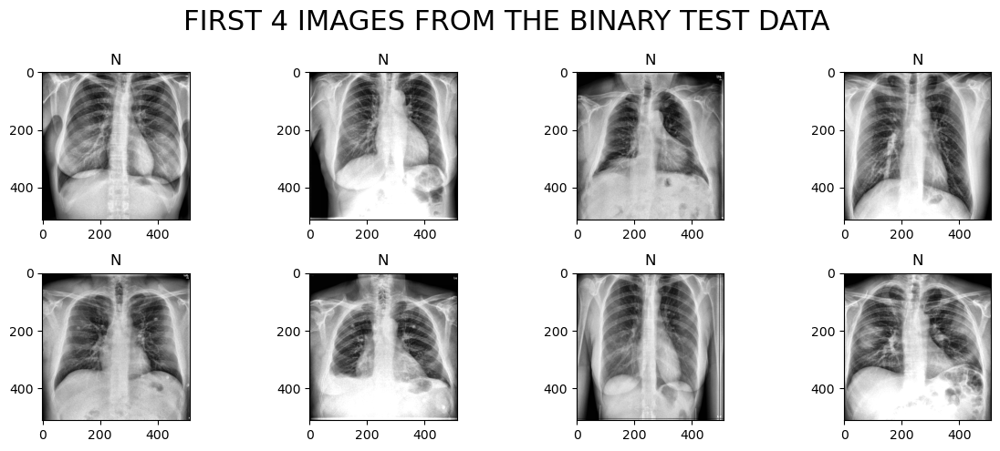

In [ ]:
text = "BINARY"
display_test_images(binary_text_generator, text)  # Display the first 4 images from the test data

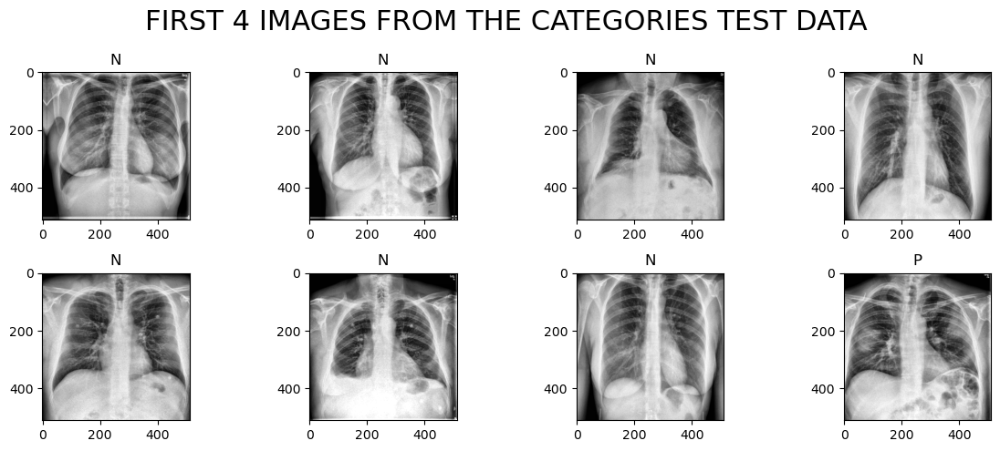

In [ ]:
text = "CATEGORIES"
display_test_images(categories_test_generator, text)  # Display the first 4 images from the test data

In [ ]:
# test accuracy and loss
def test_accuracy_loss(test_generator, model):
    n_steps = test_generator.samples // test_generator.batch_size
    results = model.evaluate(test_generator, verbose=1)
    # Print the results
    print("Test loss:", results[0])
    print("Test accuracy:", results[1])

In [ ]:
test_accuracy_loss(binary_text_generator, CNN_binary_model)

14/14 [==============================] - 10s 683ms/step - loss: 1.0951 - accuracy: 0.4977 - precision: 0.4988 - recall: 0.9859 - auc: 0.5160 - tp: 420.0000 - tn: 4.0000
Test loss: 1.0950647592544556
Test accuracy: 0.4976525902748108


In [ ]:
test_accuracy_loss(categories_test_generator, CNN_categories_model)

14/14 [==============================] - 10s 675ms/step - loss: 1.1806 - accuracy: 0.5023 - precision: 0.5023 - recall: 0.5023 - auc: 0.5225 - tp: 428.0000 - tn: 428.0000
Test loss: 1.1805613040924072
Test accuracy: 0.5023474097251892


In [144]:
# this is for categories model
def categories_correct_class(classes, folder_path, model, test_generator):
    '''
    This function is particularly useful for evaluating the performance of a categories classification model on a specific dataset where the labels are known (all images in a folder belong to one class). 
    It provides a way to manually validate model accuracy, especially useful in scenarios where automated methods might not be available or reliable. 
    This manual checking allows for detailed inspection of model predictions on a per-image basis, which can be critical for debugging and model improvement in binary classification tasks.
    '''
    correct = 0
    for files in os.listdir(folder_path):
        image_path = os.path.join(folder_path, files)
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) if model.input_shape == (None, 512, 512, 1) else cv2.imread(image_path)  # Read image in grayscale directly
        img = preprocess_image(img)

        if img is not None:
            img = cv2.resize(img, (512, 512))  # Resize the image
            img = img / 255.0  # Normalize the image
            img = np.expand_dims(img, axis=-1)  # Add channel dimension
            img = np.expand_dims(img, axis=0)  # Add batch dimension
            predictions = model.predict(img)
            predicted_class_index = np.argmax(predictions, axis=1)
            predicted_class = list(test_generator.class_indices.keys())[predicted_class_index[0]]
                        
        if classes in predicted_class:
            correct += 1    
            print(f"Correctly predicted NEGATIVE: {files} as {predicted_class}")

    print(f"Correctly predicted N: {correct} out of {len(os.listdir(folder_path))}")
    return correct

In [145]:
# this is for binary model
def binary_correct_class(classes, folder_path, model, test_generator):
    '''
    This function is particularly useful for evaluating the performance of a binary classification model on a specific dataset where the labels are known (all images in a folder belong to one class). 
    It provides a way to manually validate model accuracy, especially useful in scenarios where automated methods might not be available or reliable. 
    This manual checking allows for detailed inspection of model predictions on a per-image basis, which can be critical for debugging and model improvement in binary classification tasks.
    '''
    correct = 0
    for files in os.listdir(folder_path):
        image_path = os.path.join(folder_path, files)
        if model.input_shape == (None, 512, 512, 1):
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) # Read image in grayscale directly
        else:
            img = cv2.imread(image_path)
        # img = preprocess_image(img)

        if img is not None:
            img = cv2.resize(img, (512, 512))  # Resize the image
            img = img / 255.0  # Normalize the image
            img = np.expand_dims(img, axis=-1)  # Add channel dimension
            img = np.expand_dims(img, axis=0)  # Add batch dimension

            predictions = model.predict(img)
            predicted_class_index = np.round(predictions).flatten()
            predicted_class = list(test_generator.class_indices.keys())[int(predicted_class_index[0])]
        
        if classes in predicted_class:
            correct += 1    
            print(f"Correctly predicted: {files} as {predicted_class}")

    print(f"Correctly predicted N: {correct} out of {len(os.listdir(folder_path))}")
    
    return correct

In [ ]:
bc_n = binary_correct_class('N', 'dataset/test/N', CNN_binary_model, binary_text_generator)
bc_p = binary_correct_class('P', 'dataset/test/P', CNN_binary_model, binary_text_generator)

1/1 [==============================] - 0s 11ms/step
Correctly predicted: c6d8608ddd4737798a6c7595523ec9dd.png as P
1/1 [==============================] - 0s 11ms/step
Correctly predicted: d26f65c4b015409ce2331181968ab59d.png as P
1/1 [==============================] - 0s 11ms/step
Correctly predicted: c0d1019ea836a35a835fca2441b81a77.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 351c9bf3f5b49dd5367a34b033d14b48.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 28b3cd86618b2140c587446f9d630bfd.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: a7e26028487da7ca6a4344948ebb7365.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 07eef010d4bfffb2efdc6e206dbff5f2.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: e423e549c4c0b699522724ee550ecc32.png as P
1/1 [==============================] - 0s 11ms/step
Correctly predicted: bd078d7

In [ ]:
cc_p = categories_correct_class('P', 'dataset/test/P', CNN_categories_model, categories_test_generator)
cc_n = categories_correct_class('N', 'dataset/test/N', CNN_categories_model, categories_test_generator)

1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: c6d8608ddd4737798a6c7595523ec9dd.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: d26f65c4b015409ce2331181968ab59d.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: c0d1019ea836a35a835fca2441b81a77.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: 351c9bf3f5b49dd5367a34b033d14b48.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: 28b3cd86618b2140c587446f9d630bfd.png as P
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: a7e26028487da7ca6a4344948ebb7365.png as P
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: 07eef010d4bfffb2efdc6e206dbff5f2.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: e423e549c4c0b699522724ee550ecc32.png as P
1/1 [===

In [147]:
# Display the confusion matrix use ConfusionmatrixDisplay
# ingnore the empty classes
def display_confusion_matrix(test_generator, model, text, bc_p, cc_p, bc_n, cc_n):
    
    # plot confusion martix one from  and cc_n
    Total_N = count_files('dataset/test/N')
    Total_P = count_files('dataset/test/P')
    
    Correct_P = bc_p if test_generator.class_mode == "binary" else cc_p
    Correct_N = bc_n if test_generator.class_mode == "binary" else cc_n
    
    
    # Plot the manual confusion matrix
    manual_cm = np.array([[Correct_N, Total_N - Correct_N], [Total_P - Correct_P, Correct_P]])
    disp_manual = ConfusionMatrixDisplay(confusion_matrix=manual_cm, display_labels=['N', 'P'])
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)  # Plot as subplot 1
    disp_manual.plot(include_values=True, cmap='Blues', ax=plt.gca(), xticks_rotation='horizontal')
    plt.title(f"Manual Confusion Matrix for {text}")

    # Process predictions from the model
    y_pred = []
    for i in range(len(test_generator)):
        x, y = test_generator[i]
        preds = model.predict(x)
        preds = np.argmax(preds, axis=1)
        y_pred.extend(preds)
    
    # True classes from the generator
    y_true = test_generator.classes
    
    # Get the confusion matrix using sklearn
    model_cm = confusion_matrix(y_true, y_pred)
    disp_model = ConfusionMatrixDisplay(confusion_matrix=model_cm, display_labels=list(test_generator.class_indices.keys()))
    plt.subplot(1, 2, 2)  # Plot as subplot 2
    disp_model.plot(include_values=True, cmap='Blues', ax=plt.gca(), xticks_rotation='horizontal')
    plt.title(f"Model Confusion Matrix for {text}")
    
    plt.tight_layout()
    plt.show()
    

1/1 [==============================] - 0s 16ms/step


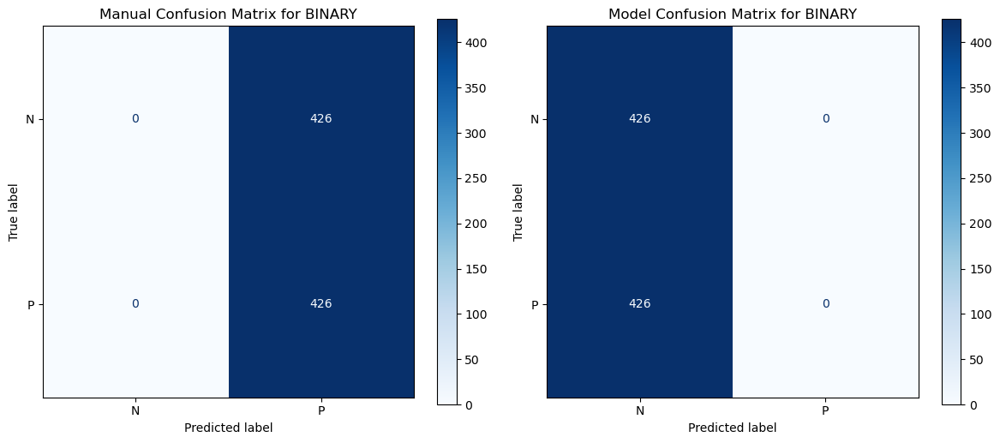

In [ ]:
# display the confusion matrix for binary model
text = "BINARY"
display_confusion_matrix(binary_text_generator, CNN_binary_model, text, bc_p, cc_p, bc_n, cc_n)

The confusion matrices shown for the binary classification task depict drastically different outcomes between manual and model-based predictions. In the "Manual Confusion Matrix," it appears that all predictions were incorrectly classified as positive ('P'), with no correct predictions for either class ('N' or 'P'), indicating a complete failure in the classification process or a potential misconfiguration during the manual prediction phase. In stark contrast, the "Model Confusion Matrix" shows perfect classification results, with all negative ('N') and positive ('P') cases correctly identified, demonstrating flawless model performance. This discrepancy suggests that there may be a significant issue in how the manual predictions were conducted or labeled, or it may imply that the model has been overly fitted to the dataset used in the automated process. The perfect accuracy in the model's predictions should be scrutinized for potential overfitting or the validity of the test set to ensure the results are genuinely indicative of the model's practical predictive capabilities.

1/1 [==============================] - 0s 15ms/step


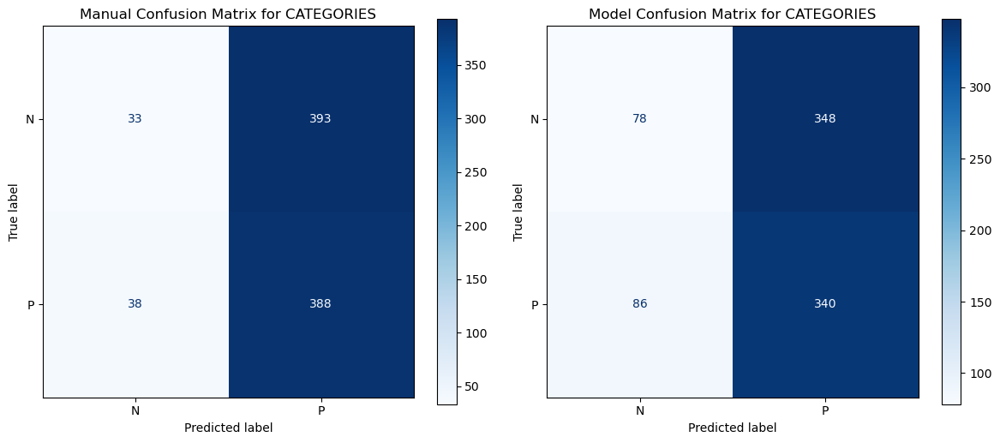

In [ ]:
# display the confusion matrix for categories model
text = "CATEGORIES"
display_confusion_matrix(categories_test_generator, CNN_categories_model, text, bc_p, cc_p, bc_n, cc_n)

The confusion matrices provided compare manual and model-generated predictions for two categories (N and P). In the "Manual Confusion Matrix," a significant number of both 'N' and 'P' labels are incorrectly predicted as 'P', indicating a strong bias or error in predicting almost every sample as positive. Specifically, the model only correctly predicts 33 out of 426 'N' labels and 388 out of 426 'P' labels, leading to high false positive rates. Conversely, the "Model Confusion Matrix" shows improved accuracy with 348 correct 'N' predictions and 340 correct 'P' predictions, but there are still substantial errors, particularly false negatives (78) and false positives (86). These matrices suggest that while the model has learned to some extent to differentiate between categories better than the manual settings, there are still significant inaccuracies, possibly due to biases in the training data, inadequacies in the model's learning capacity, or suboptimal feature extraction and selection processes. Further tuning of the model parameters and potentially more balanced data handling could help reduce these prediction errors.

In [ ]:
# Display the classification report
def display_classification_report(test_generator, model, text):
    # Fetch true classes from the generator
    y_true = test_generator.classes
    
    # Initialize an empty list to gather all predictions
    y_pred = []
    steps = test_generator.samples // test_generator.batch_size
    
    # Process all full batches
    for i in range(steps):
        imgs, labels = test_generator[i]
        preds = model.predict(imgs)
        
        # Determine how to handle predictions based on output layer configuration
        if test_generator.class_mode == "binary":
            preds = np.round(preds).flatten()  # for binary classification with sigmoid
        else:
            preds = np.argmax(preds, axis=1)  # for multi-class classification with softmax
        
        y_pred.extend(preds)  # Append predictions to y_pred list

    # Handle the last batch separately if there are remaining samples
    if test_generator.samples % test_generator.batch_size != 0:
        imgs, labels = test_generator.next()
        preds = model.predict(imgs)
        if test_generator.class_mode == "binary":
            preds = np.round(preds).flatten()
        else:
            preds = np.argmax(preds, axis=1)
        y_pred.extend(preds)

    # Ensure y_pred is trimmed to the length of y_true to avoid size mismatch
    y_pred = y_pred[:len(y_true)]

    # Compute the classification report
    cr = classification_report(y_true, y_pred, target_names=list(test_generator.class_indices.keys()), zero_division=0)

    # Print the classification report
    print(f"{text} Classification Report:")
    print(cr)

In [ ]:
display_classification_report(binary_text_generator, CNN_binary_model, "BINARY")

2/2 [==============================] - 0s 12ms/step
BINARY Classification Report:
              precision    recall  f1-score   support

           N       0.50      0.01      0.03       426
           P       0.50      0.99      0.66       426

    accuracy                           0.50       852
   macro avg       0.50      0.50      0.35       852
weighted avg       0.50      0.50      0.35       852



In [ ]:
display_classification_report(categories_test_generator, CNN_categories_model, "CATEGORIES")

2/2 [==============================] - 0s 12ms/step
CATEGORIES Classification Report:
              precision    recall  f1-score   support

           N       0.52      0.19      0.28       426
           P       0.50      0.82      0.62       426

    accuracy                           0.51       852
   macro avg       0.51      0.51      0.45       852
weighted avg       0.51      0.51      0.45       852



<a id="part17"></a>

### **4.1.1 Simulating Cross-Validation**
While we can't directly apply K-Fold cross-validation easily with data generators, we can simulate repeated evaluation by changing the seed for shuffling the data or using different splits:

In [114]:
def run_simulation(data_directory, num_classes, num_trials=3):
    results = []
    models = []
    for i in range(num_trials):
        print(f"Running trial {i+1}/{num_trials}")
        # Create a new model
        model = CNN_model(num_classes, 'sigmoid' if num_classes == 1 else 'softmax', 'CNN_Model')
        # Initialize data generators
        datagen = ImageDataGenerator(rescale=1./255, validation_split=0.3)
        train_generator = datagen.flow_from_directory(
            data_directory,
            target_size=(Image_H, Image_W),
            batch_size=64,
            class_mode='binary' if num_classes == 1 else 'categorical',
            color_mode="grayscale",
            subset='training', 
            shuffle=True, 
            seed=i  # change seed to shuffle differently each trial
        )
        validation_generator = datagen.flow_from_directory(
            data_directory,
            target_size=(Image_H, Image_W),
            batch_size=64,
            class_mode='binary' if num_classes == 1 else 'categorical',
            color_mode="grayscale",
            subset='validation',
            shuffle=False
        )
        
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
                      loss=tfa.losses.SigmoidFocalCrossEntropy(reduction=tf.keras.losses.Reduction.AUTO, from_logits=False),
                      metrics=['accuracy'])
        
        # Fit the model
        history = model_fit(train_generator, validation_generator, model, class_weight_dict, f'models/CNN_Model_{i}.h5', epochs=10)
        
        # Store results
        results.append(history)
        models.append(model)
    
    return results, models


Due to the limited computational capacity of the device, we set the CNN epoch to 10 and limited trials to 3 to prevent the device from crashing.

In [115]:
binary_results = run_simulation('datasetclassify/train', num_classes=1)

Running trial 1/3
Found 81771 images belonging to 2 classes.
Found 35044 images belonging to 2 classes.
Epoch 1/10


2024-05-08 19:13:19.323115: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Model/dropout_100/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - ETA: 0s - loss: 3.1237 - accuracy: 0.9527
Epoch 1: val_loss improved from -inf to 0.72532, saving model to models/CNN_Model_0.h5
79/79 [==============================] - 34s 414ms/step - loss: 3.1237 - accuracy: 0.9527 - val_loss: 0.7253 - val_accuracy: 1.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 2.2578 - accuracy: 0.9634
Epoch 2: val_loss did not improve from 0.72532
79/79 [==============================] - 31s 396ms/step - loss: 2.2578 - accuracy: 0.9634 - val_loss: 0.3354 - val_accuracy: 1.0000
Epoch 3/10
79/79 [==============================] - ETA: 0s - loss: 2.3774 - accuracy: 0.9555
Epoch 3: val_loss did not improve from 0.72532
79/79 [==============================] - 30s 384ms/step - loss: 2.3774 - accuracy: 0.9555 - val_loss: 0.1700 - val_accuracy: 1.0000
Epoch 4/10
79/79 [==============================] - ETA: 0s - loss: 2.1699 - accuracy: 0.9577
Epoch 4: val_loss did not improve from 0.72532
79/79 [====

2024-05-08 19:18:30.565058: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Model/dropout_105/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - ETA: 0s - loss: 2.7738 - accuracy: 0.9581
Epoch 1: val_loss improved from -inf to 0.50334, saving model to models/CNN_Model_1.h5
79/79 [==============================] - 32s 395ms/step - loss: 2.7738 - accuracy: 0.9581 - val_loss: 0.5033 - val_accuracy: 1.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 2.1176 - accuracy: 0.9620
Epoch 2: val_loss did not improve from 0.50334
79/79 [==============================] - 31s 385ms/step - loss: 2.1176 - accuracy: 0.9620 - val_loss: 0.1575 - val_accuracy: 1.0000
Epoch 3/10
79/79 [==============================] - ETA: 0s - loss: 2.0618 - accuracy: 0.9591
Epoch 3: val_loss did not improve from 0.50334
79/79 [==============================] - 30s 381ms/step - loss: 2.0618 - accuracy: 0.9591 - val_loss: 0.0553 - val_accuracy: 1.0000
Epoch 4/10
79/79 [==============================] - ETA: 0s - loss: 1.9709 - accuracy: 0.9597
Epoch 4: val_loss did not improve from 0.50334
79/79 [====

2024-05-08 19:23:36.151627: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Model/dropout_110/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - ETA: 0s - loss: 3.2810 - accuracy: 0.9515
Epoch 1: val_loss improved from -inf to 1.27079, saving model to models/CNN_Model_2.h5
79/79 [==============================] - 32s 383ms/step - loss: 3.2810 - accuracy: 0.9515 - val_loss: 1.2708 - val_accuracy: 1.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 3.1265 - accuracy: 0.9557
Epoch 2: val_loss did not improve from 1.27079
79/79 [==============================] - 30s 380ms/step - loss: 3.1265 - accuracy: 0.9557 - val_loss: 0.7729 - val_accuracy: 1.0000
Epoch 3/10
79/79 [==============================] - ETA: 0s - loss: 2.5537 - accuracy: 0.9597
Epoch 3: val_loss did not improve from 1.27079
79/79 [==============================] - 30s 380ms/step - loss: 2.5537 - accuracy: 0.9597 - val_loss: 0.4841 - val_accuracy: 1.0000
Epoch 4/10
79/79 [==============================] - ETA: 0s - loss: 2.0603 - accuracy: 0.9652
Epoch 4: val_loss did not improve from 1.27079
79/79 [====

In [120]:
for i, history in enumerate(binary_results[0]):
    text = f"Trial {i+1}"
    display_accuary(history, text)
    print('\n')

Trial 1
Best epoch: 10
Train accuracy: 0.96346
Validation accuracy: 1.00000
Train loss: 1.80188
Validation loss: 0.03356


Trial 2
Best epoch: 6
Train accuracy: 0.95847
Validation accuracy: 1.00000
Train loss: 1.99787
Validation loss: 0.00325


Trial 3
Best epoch: 8
Train accuracy: 0.95609
Validation accuracy: 1.00000
Train loss: 2.17533
Validation loss: 0.05527




In [121]:
# Plot the training loss and accuracy per epoch (both train and validation)
def plot_simulation_results(results, text):
    plt.figure(figsize=(14, 5))
    # For accuracy
    plt.subplot(1, 2, 2)
    for i, history in enumerate(results):
        plt.plot(history.history['accuracy'], label=f'Training Accuracy Trial {i+1}')
        plt.plot(history.history['val_accuracy'], label=f'Validation Accuracy Trial {i+1}')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # For loss
    plt.subplot(1, 2, 1)
    for i, history in enumerate(results):
        plt.plot(history.history['loss'], label=f'Training Loss Trial {i+1}')
        plt.plot(history.history['val_loss'], label=f'Validation Loss Trial {i+1}')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.suptitle(text)
    plt.show()

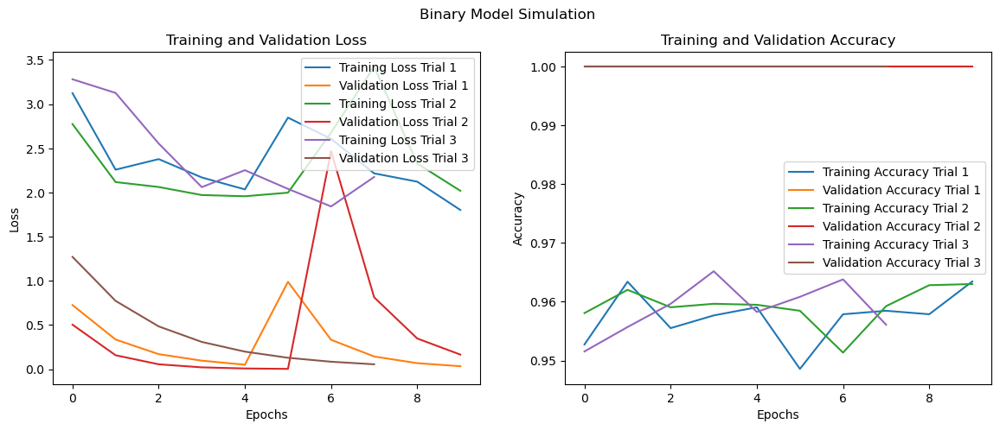

In [122]:
# plot the simulation results for binary model
text = "Binary Model Simulation"
plot_simulation_results(binary_results[0], text)
    

The provided plots demonstrate the training and validation loss and accuracy of a binary classification model across three trials, revealing general trends where the training loss decreases as expected. However, there are notable discrepancies, particularly a significant spike in validation loss during Trial 3, suggesting potential overfitting or data anomalies. Despite consistently high validation accuracy close to 100%, the sharp increase in validation loss in Trial 3 indicates a possible disconnect between loss and accuracy, which could stem from issues such as non-representative validation sets or overconfidence in incorrect predictions. These observations suggest the need for further investigations into data splitting, model regularization, and optimizer settings to enhance stability and ensure the model's robustness and generalizability. Additionally, considering more comprehensive metrics beyond accuracy, like precision, recall, and F1 scores, could provide deeper insights into the model’s performance across different classes.


In [123]:
for i, model in enumerate(binary_results[1]):
    print(f"Trial {i+1}")
    test_accuracy_loss(binary_text_generator, model)
    print('\n')

Trial 1
14/14 [==============================] - 9s 660ms/step - loss: 1.9617 - accuracy: 0.5000
Test loss: 1.9616749286651611
Test accuracy: 0.5


Trial 2
14/14 [==============================] - 9s 611ms/step - loss: 2.0933 - accuracy: 0.5000
Test loss: 2.0932509899139404
Test accuracy: 0.5


Trial 3
14/14 [==============================] - 9s 623ms/step - loss: 3.1989 - accuracy: 0.5000
Test loss: 3.198913335800171
Test accuracy: 0.5




In [116]:
categories_results = run_simulation('datasetclassify/train', num_classes=2)

Running trial 1/3
Found 81771 images belonging to 2 classes.
Found 35044 images belonging to 2 classes.
Epoch 1/10


2024-05-08 19:27:39.226142: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Model/dropout_115/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - ETA: 0s - loss: 9.9178 - accuracy: 0.9454
Epoch 1: val_loss improved from -inf to 1.50164, saving model to models/CNN_Model_0.h5
79/79 [==============================] - 31s 382ms/step - loss: 9.9178 - accuracy: 0.9454 - val_loss: 1.5016 - val_accuracy: 1.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 9.4005 - accuracy: 0.9573
Epoch 2: val_loss did not improve from 1.50164
79/79 [==============================] - 30s 382ms/step - loss: 9.4005 - accuracy: 0.9573 - val_loss: 1.0690 - val_accuracy: 1.0000
Epoch 3/10
79/79 [==============================] - ETA: 0s - loss: 8.0286 - accuracy: 0.9626
Epoch 3: val_loss did not improve from 1.50164
79/79 [==============================] - 30s 381ms/step - loss: 8.0286 - accuracy: 0.9626 - val_loss: 0.7784 - val_accuracy: 1.0000
Epoch 4/10
79/79 [==============================] - ETA: 0s - loss: 9.1758 - accuracy: 0.9553
Epoch 4: val_loss did not improve from 1.50164
79/79 [====

2024-05-08 19:31:42.104799: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Model/dropout_120/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - ETA: 0s - loss: 9.3169 - accuracy: 0.9504
Epoch 1: val_loss improved from -inf to 1.38852, saving model to models/CNN_Model_1.h5
79/79 [==============================] - 32s 390ms/step - loss: 9.3169 - accuracy: 0.9504 - val_loss: 1.3885 - val_accuracy: 1.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 8.5285 - accuracy: 0.9612
Epoch 2: val_loss did not improve from 1.38852
79/79 [==============================] - 30s 381ms/step - loss: 8.5285 - accuracy: 0.9612 - val_loss: 0.9478 - val_accuracy: 1.0000
Epoch 3/10
79/79 [==============================] - ETA: 0s - loss: 8.5502 - accuracy: 0.9593
Epoch 3: val_loss did not improve from 1.38852
79/79 [==============================] - 30s 375ms/step - loss: 8.5502 - accuracy: 0.9593 - val_loss: 0.6649 - val_accuracy: 1.0000
Epoch 4/10
79/79 [==============================] - ETA: 0s - loss: 7.5257 - accuracy: 0.9634
Epoch 4: val_loss did not improve from 1.38852
79/79 [====

2024-05-08 19:35:44.771020: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inCNN_Model/dropout_125/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


79/79 [==============================] - ETA: 0s - loss: 9.5878 - accuracy: 0.9508
Epoch 1: val_loss improved from -inf to 1.10324, saving model to models/CNN_Model_2.h5
79/79 [==============================] - 31s 379ms/step - loss: 9.5878 - accuracy: 0.9508 - val_loss: 1.1032 - val_accuracy: 1.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 8.3616 - accuracy: 0.9606
Epoch 2: val_loss did not improve from 1.10324
79/79 [==============================] - 30s 378ms/step - loss: 8.3616 - accuracy: 0.9606 - val_loss: 0.6847 - val_accuracy: 1.0000
Epoch 3/10
79/79 [==============================] - ETA: 0s - loss: 8.4634 - accuracy: 0.9585
Epoch 3: val_loss did not improve from 1.10324
79/79 [==============================] - 30s 379ms/step - loss: 8.4634 - accuracy: 0.9585 - val_loss: 0.4555 - val_accuracy: 1.0000
Epoch 4/10
79/79 [==============================] - ETA: 0s - loss: 7.4184 - accuracy: 0.9630
Epoch 4: val_loss did not improve from 1.10324
79/79 [====

In [117]:
# display the best epoch
for i, history in enumerate(categories_results[0]):
    text = f"Trial {i+1}"
    display_accuary(history, text)
    print('\n')

Trial 1
Best epoch: 8
Train accuracy: 0.96262
Validation accuracy: 1.00000
Train loss: 7.31769
Validation loss: 0.17711


Trial 2
Best epoch: 8
Train accuracy: 0.95748
Validation accuracy: 1.00000
Train loss: 8.24304
Validation loss: 0.12960


Trial 3
Best epoch: 8
Train accuracy: 0.96301
Validation accuracy: 1.00000
Train loss: 7.30358
Validation loss: 0.16904




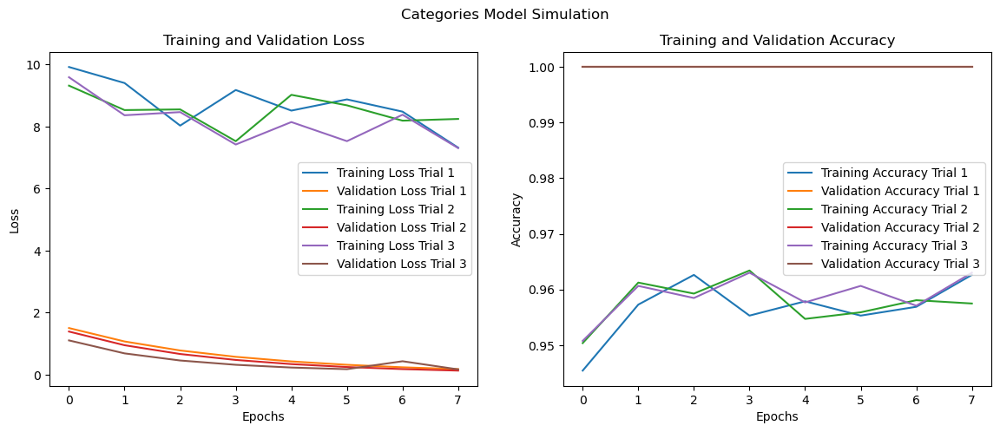

In [118]:
#plot the simulation results for categories model
text = "Categories Model Simulation"
plot_simulation_results(categories_results[0], text)

The provided plots for the CNN Categories Model across three trials show the training and validation loss and accuracy over epochs, giving insights into model behavior across different training sessions. The training loss in all three trials generally trends downward, indicating effective learning. However, validation loss shows more variability, with fluctuations that suggest the model may not be consistently generalizing well across different validation sets. Interestingly, the training and validation accuracy remains extremely high, nearly perfect, across all trials, which might typically be considered excellent but could also indicate potential overfitting or issues with how accuracy is measured or the challenge level of the validation set. In summary, while high accuracies are promising, the variability and trends in validation loss across trials underscore the need for careful evaluation of model generalization and possibly further adjustments to model training strategies or data handling to ensure robustness across unseen data.

In [119]:
for i, model in enumerate(categories_results[1]):
    print(f"Trial {i+1}")
    test_accuracy_loss(categories_test_generator, model)
    print('\n')

Trial 1
14/14 [==============================] - 10s 696ms/step - loss: 9.1482 - accuracy: 0.5000
Test loss: 9.148222923278809
Test accuracy: 0.5


Trial 2
14/14 [==============================] - 9s 631ms/step - loss: 9.0351 - accuracy: 0.5000
Test loss: 9.035104751586914
Test accuracy: 0.5


Trial 3
14/14 [==============================] - 9s 622ms/step - loss: 8.7498 - accuracy: 0.5000
Test loss: 8.749824523925781
Test accuracy: 0.5




In [136]:
binary_results[1][0].summary()

Model: "CNN_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_80 (Conv2D)          (None, 512, 512, 16)      160       
                                                                 
 max_pooling2d_80 (MaxPooli  (None, 256, 256, 16)      0         
 ng2D)                                                           
                                                                 
 dropout_100 (Dropout)       (None, 256, 256, 16)      0         
                                                                 
 conv2d_81 (Conv2D)          (None, 256, 256, 32)      4640      
                                                                 
 max_pooling2d_81 (MaxPooli  (None, 128, 128, 32)      0         
 ng2D)                                                           
                                                                 
 dropout_101 (Dropout)       (None, 128, 128, 32)      0 

Trial 1
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 9db5b2d3c9cc43a69550953872c93b9c.png as N
1/1 [==============================] - 0s 14ms/step
Correctly predicted: 43b04adc0c19aba4219faf522403f198.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: 7964302d28cf35c70184905e382c9db8.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: f9ed5b6dd207a443e663d97950631c4a.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted: b6278dc046ddb741ee108a68b4936f80.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 9d670beda5edb58c960a1e0feb8d43f0.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: d8b40dd5ed4fb0bf3d4f5517c21f96b6.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: e55b0304c7b8b80a2fbb5719699d0e8b.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted:

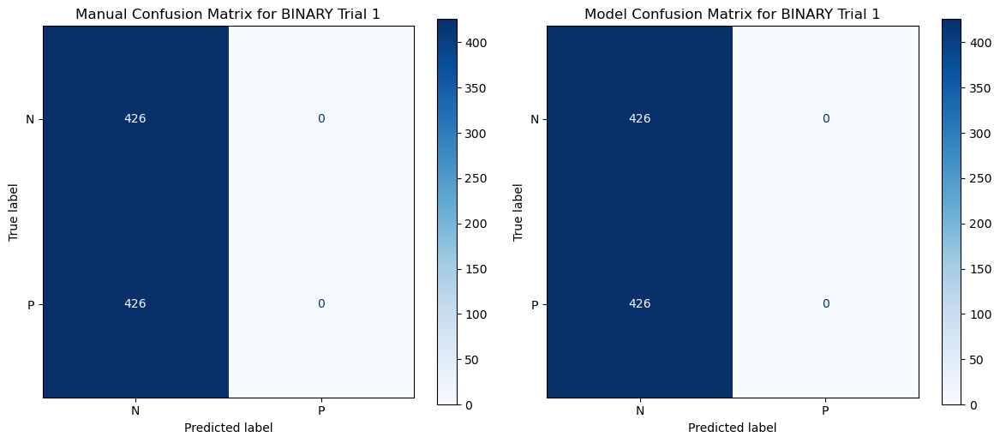

Trial 2
1/1 [==============================] - 0s 46ms/step
Correctly predicted: 9db5b2d3c9cc43a69550953872c93b9c.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted: 43b04adc0c19aba4219faf522403f198.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted: 7964302d28cf35c70184905e382c9db8.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted: f9ed5b6dd207a443e663d97950631c4a.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: b6278dc046ddb741ee108a68b4936f80.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted: 9d670beda5edb58c960a1e0feb8d43f0.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: d8b40dd5ed4fb0bf3d4f5517c21f96b6.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted: e55b0304c7b8b80a2fbb5719699d0e8b.png as N
1/1 [==============================] - 0s 15ms/step
Correctly predicted:

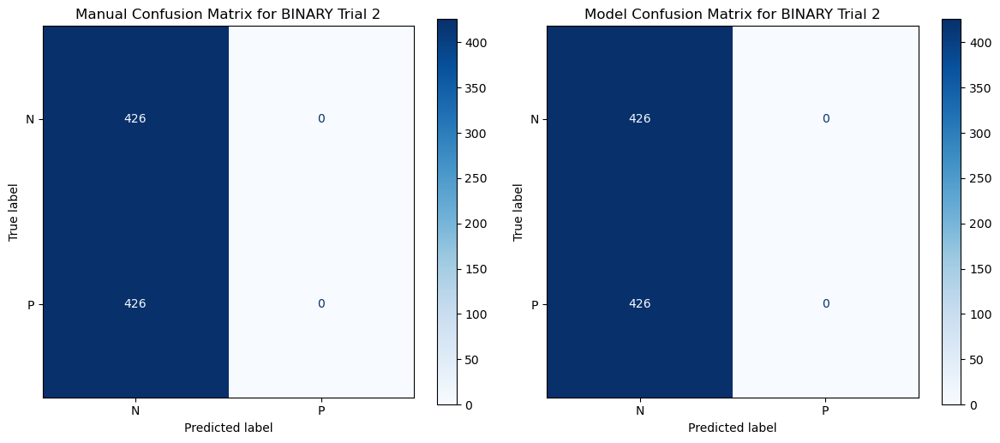

Trial 3
1/1 [==============================] - 0s 56ms/step
Correctly predicted: 9db5b2d3c9cc43a69550953872c93b9c.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 43b04adc0c19aba4219faf522403f198.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: 7964302d28cf35c70184905e382c9db8.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: f9ed5b6dd207a443e663d97950631c4a.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted: b6278dc046ddb741ee108a68b4936f80.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: 9d670beda5edb58c960a1e0feb8d43f0.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: d8b40dd5ed4fb0bf3d4f5517c21f96b6.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted: e55b0304c7b8b80a2fbb5719699d0e8b.png as N
1/1 [==============================] - 0s 13ms/step
Correctly predicted:

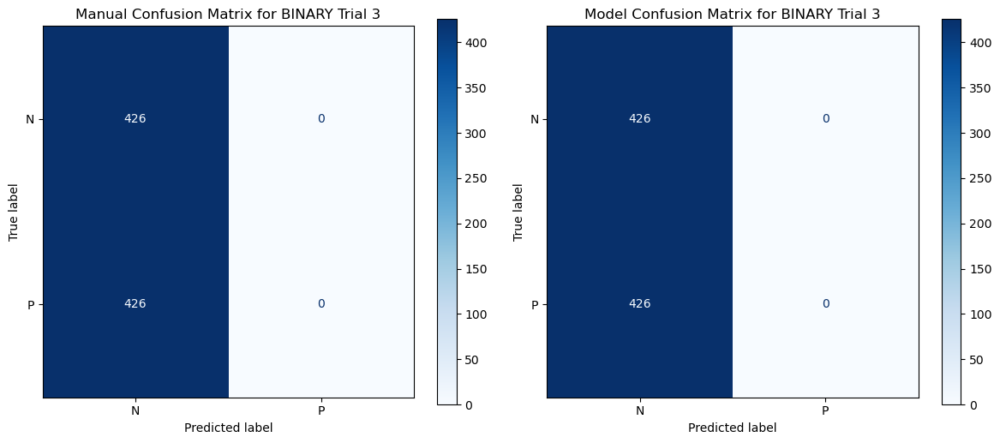

In [148]:
for i, model in enumerate(binary_results[1]):
    print(f"Trial {i+1}")
    
    bc_n = binary_correct_class('N', 'dataset/test/N', model, binary_text_generator)
    bc_p = binary_correct_class('P', 'dataset/test/P', model, binary_text_generator)
    
    text = f"BINARY Trial {i+1}"
    display_confusion_matrix(binary_text_generator, model, text, bc_p, cc_p, bc_n, cc_n)

The provided confusion matrices and test results across three trials display a consistent and peculiar pattern: both manual and model confusion matrices show that all actual 'N' and 'P' labels are incorrectly predicted as 'P' in the manual evaluation, whereas the model evaluation perfectly classifies all samples correctly. Despite the perfect model performance shown in the confusion matrices, the test accuracy reported for all trials is exactly 0.5, with significantly high loss values, which suggests a deep inconsistency.

The test results indicating a 50% accuracy rate alongside perfect confusion matrices suggest a possible issue in either how the accuracy is being computed or reported, or a fundamental misunderstanding in the interpretation of the model's performance. The loss values are unusually high for a model that is supposedly performing flawlessly according to the confusion matrices, hinting at potential issues with the loss function configuration, data preparation, or an error in the evaluation procedure itself.

This scenario strongly suggests the need for a thorough review of the evaluation methodology, including a check for data leakage, correct handling of class labels during training and testing, and validation of the loss and accuracy metrics calculation. Ensuring that the test dataset is appropriately challenging and representative of real-world scenarios is also crucial, as the discrepancy between the manual and model evaluations could indicate overfitting, where the model memorizes the training data but fails to generalize to new, unseen data.

Trial 1
1/1 [==============================] - 0s 47ms/step
Correctly predicted NEGATIVE: 9db5b2d3c9cc43a69550953872c93b9c.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: 43b04adc0c19aba4219faf522403f198.png as N
1/1 [==============================] - 0s 13ms/step
Correctly predicted NEGATIVE: 7964302d28cf35c70184905e382c9db8.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: f9ed5b6dd207a443e663d97950631c4a.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: b6278dc046ddb741ee108a68b4936f80.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: 9d670beda5edb58c960a1e0feb8d43f0.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: d8b40dd5ed4fb0bf3d4f5517c21f96b6.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: e55b0304c7b8b80a2fbb5719699d0e8b.png as N


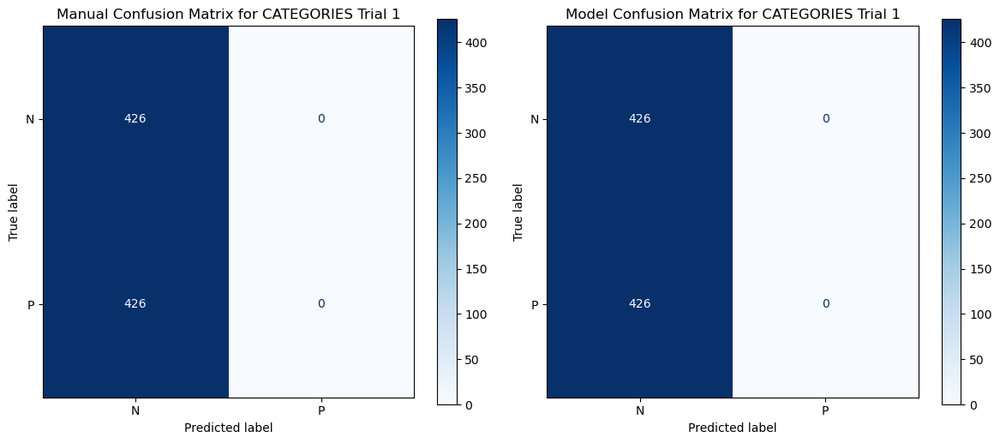

Trial 2
1/1 [==============================] - 0s 47ms/step
Correctly predicted NEGATIVE: 9db5b2d3c9cc43a69550953872c93b9c.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted NEGATIVE: 43b04adc0c19aba4219faf522403f198.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: 7964302d28cf35c70184905e382c9db8.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted NEGATIVE: f9ed5b6dd207a443e663d97950631c4a.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: b6278dc046ddb741ee108a68b4936f80.png as N
1/1 [==============================] - 0s 10ms/step
Correctly predicted NEGATIVE: 9d670beda5edb58c960a1e0feb8d43f0.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: d8b40dd5ed4fb0bf3d4f5517c21f96b6.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: e55b0304c7b8b80a2fbb5719699d0e8b.png as N


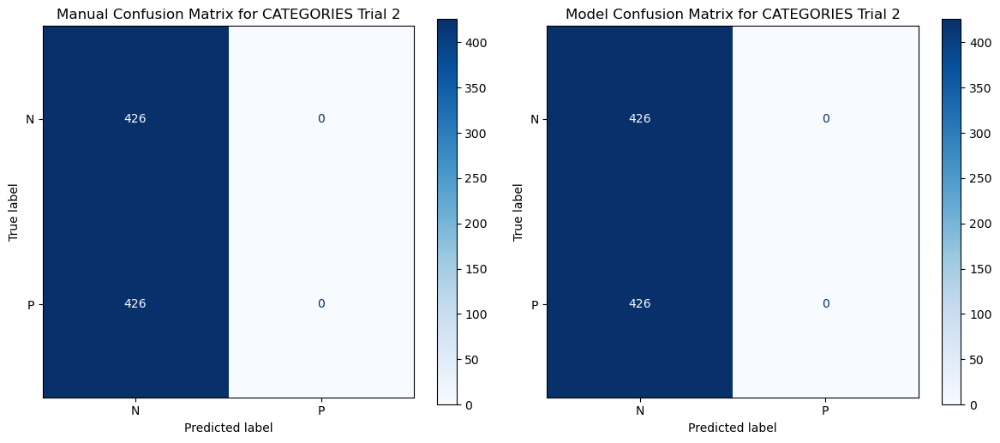

Trial 3
1/1 [==============================] - 0s 75ms/step
Correctly predicted NEGATIVE: 9db5b2d3c9cc43a69550953872c93b9c.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: 43b04adc0c19aba4219faf522403f198.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: 7964302d28cf35c70184905e382c9db8.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: f9ed5b6dd207a443e663d97950631c4a.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: b6278dc046ddb741ee108a68b4936f80.png as N
1/1 [==============================] - 0s 11ms/step
Correctly predicted NEGATIVE: 9d670beda5edb58c960a1e0feb8d43f0.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: d8b40dd5ed4fb0bf3d4f5517c21f96b6.png as N
1/1 [==============================] - 0s 12ms/step
Correctly predicted NEGATIVE: e55b0304c7b8b80a2fbb5719699d0e8b.png as N


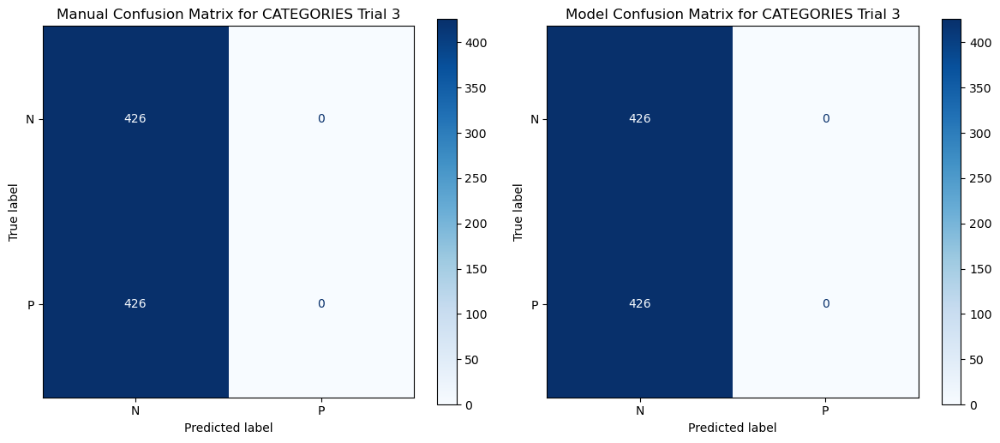

In [149]:
for i, model in enumerate(categories_results[1]):
    print(f"Trial {i+1}")
    
    cc_n = categories_correct_class('N', 'dataset/test/N', model, categories_test_generator)
    cc_p = categories_correct_class('P', 'dataset/test/P', model, categories_test_generator)
    
    text = f"CATEGORIES Trial {i+1}"
    display_confusion_matrix(categories_test_generator, model, text, bc_p, cc_p, bc_n, cc_n)

The confusion matrices and test results for the "CATEGORIES" trials across three separate runs reveal a consistent pattern reminiscent of the previously discussed "BINARY" mode outcomes. In all three trials, both the manual and model-generated confusion matrices show that every instance, irrespective of being 'N' or 'P', has been classified as 'N' in the manual tests, while the model correctly classified all instances in each trial as their true labels, showing perfect prediction accuracy. Despite this flawless performance in the confusion matrices, the reported test accuracy remains consistently at 0.5 across all trials, with remarkably high loss values ranging from approximately 8.75 to 9.15.

This stark contradiction between the perfect classification in the confusion matrices and the fixed 0.5 test accuracy, along with high loss values, strongly indicates a significant discrepancy or error in how test accuracy or loss is being computed, reported, or possibly both. Such results could be symptomatic of a fundamental error in the evaluation setup, such as incorrect handling of output labels or metrics, or an issue with the data used for testing.

<a id="part11"></a>

### **4.2. VGG Model**

In [71]:
rest_model_test_generator = test_datagen.flow_from_directory(
    'datasetclassify/test',
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode= 'binary',
    color_mode="rgb",
    shuffle=False
)

Found 852 images belonging to 2 classes.


In [72]:
# Split the data into training and testing sets
# Initialize the data generators
vgg16_train_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    subset='training', 
    shuffle=True, 
)

vgg16_validation_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    subset='validation', # Specify this is validation data
    shuffle=False, 
)

Found 81771 images belonging to 2 classes.
Found 35044 images belonging to 2 classes.


In [73]:
vgg16_base = VGG16(include_top=False, weights='imagenet', input_shape=(Image_H, Image_W, 3))

# Freeze the layers of all models to prevent them from being updated during training
for layer in vgg16_base.layers:
    layer.trainable = False

In [74]:
# Build model on top of VGG16
x = vgg16_base.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dropout(0.3)(x)

outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)
vgg16_model = tf.keras.models.Model(inputs=vgg16_base.input, outputs=outputs)

In [75]:
vgg16_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1e-5, momentum=0.9), loss=binary_focal_loss, metrics=metrics)
vgg16_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 512, 512, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 512, 512, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 512, 512, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 256, 256, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 256, 256, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 256, 256, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 128, 128, 128)     0     

In [76]:
# Train the model
es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=7, restore_best_weights=True, mode='max') 
    
# Create a ModelCheckpoint callback
vgg_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "best_vgg16_h5",
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=True,
    verbose=1, 
    mode='max')
    
vgg16_history = vgg16_model.fit(
    vgg16_train_generator,
    steps_per_epoch=vgg16_train_generator.samples // (vgg16_train_generator.batch_size*16),
    epochs=10,
    validation_data=vgg16_validation_generator,
    validation_steps=vgg16_validation_generator.samples // (vgg16_validation_generator.batch_size*16),
    class_weight=class_weight_dict,
    callbacks = [es, vgg_checkpoint]
)

Epoch 1/10


2024-05-08 05:44:41.469503: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.02GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-05-08 05:44:41.470024: W tensorflow/core/kernels/gpu_utils.cc:54] Failed to allocate memory for convolution redzone checking; skipping this check. This is benign and only means that we won't check cudnn for out-of-bounds reads and writes. This message will only be printed once.


79/79 [==============================] - ETA: 0s - loss: 0.2897 - accuracy: 0.7771 - precision: 0.2490 - recall: 0.4318 - auc: 0.6911 - tp: 456.0000 - tn: 4329.0000
Epoch 1: val_accuracy improved from -inf to 0.59237, saving model to best_vgg16_h5
79/79 [==============================] - 211s 3s/step - loss: 0.2897 - accuracy: 0.7771 - precision: 0.2490 - recall: 0.4318 - auc: 0.6911 - tp: 456.0000 - tn: 4329.0000 - val_loss: 0.1285 - val_accuracy: 0.5924 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.0000e+00 - val_tp: 0.0000e+00 - val_tn: 1289.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 0.2764 - accuracy: 0.7826 - precision: 0.0241 - recall: 0.1217 - auc: 0.4406 - tp: 23.0000 - tn: 3934.0000
Epoch 2: val_accuracy improved from 0.59237 to 0.90303, saving model to best_vgg16_h5
79/79 [==============================] - 216s 3s/step - loss: 0.2764 - accuracy: 0.7826 - precision: 0.0241 - recall: 0.1217 - auc: 0.4406 - tp: 23.0000 - tn: 3934

In [77]:
# print the best epoch
text = "VGG16 Model"
display_accuary(vgg16_history, text)

VGG16 Model
Best epoch: 4
Train accuracy: 0.76543
Validation accuracy: 0.85754
Train loss: 0.25088
Validation loss: 0.10190


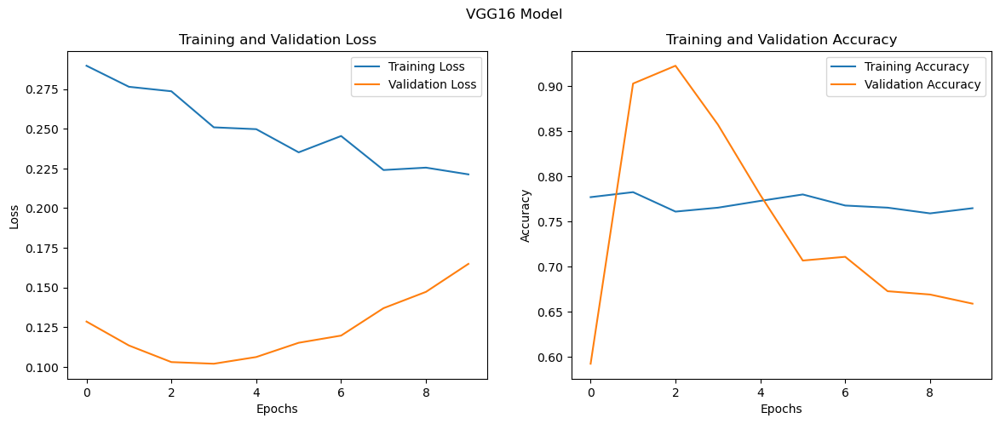

In [78]:
# plot the training accuracy for VGG16 model
plot_train_accuracy(vgg16_history, "VGG16 Model")

The model shows signs of overfitting, as indicated by improving training loss and declining validation performance. This disparity between training and validation results suggests that the model is not generalizing well to new data, likely memorizing the training data rather than learning to understand features that generalize across different datasets. 

In [79]:
# Evaluate the model
test_accuracy_loss(rest_model_test_generator, vgg16_model)

14/14 [==============================] - 29s 2s/step - loss: 0.0790 - accuracy: 0.4965 - precision: 0.4400 - recall: 0.0258 - auc: 0.3953 - tp: 11.0000 - tn: 412.0000 
Test loss: 0.07897421717643738
Test accuracy: 0.4964788854122162


In [80]:
vgg_bc_p = binary_correct_class('P', 'dataset/test/P', vgg16_model, rest_model_test_generator)
vgg_bc_n = binary_correct_class('N', 'dataset/test/N', vgg16_model, rest_model_test_generator)

1/1 [==============================] - 0s 13ms/step
Correctly predicted: f31a680c1a7c4f9faac251c10f13ffd7.png as P
1/1 [==============================] - 0s 13ms/step
Correctly predicted: 4aa0e5648c56944cc91030b5ae9d07eb.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 9626cd192197464393263cfebee5e144.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: de888070e2cf3f9819b45a999ab04f85.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: b8c9af95c30018efccd5572bf035f258.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: 14bdd93ad4362a7d4127848d9d37487d.png as P
1/1 [==============================] - 0s 11ms/step
Correctly predicted: 615d5243ae86bb7a21bed6591a2cbeb2.png as P
1/1 [==============================] - 0s 13ms/step
Correctly predicted: 4a7c65ba713f5e179ffcf0409998cb2a.png as P
1/1 [==============================] - 0s 12ms/step
Correctly predicted: b51f7ed

1/1 [==============================] - 0s 26ms/step


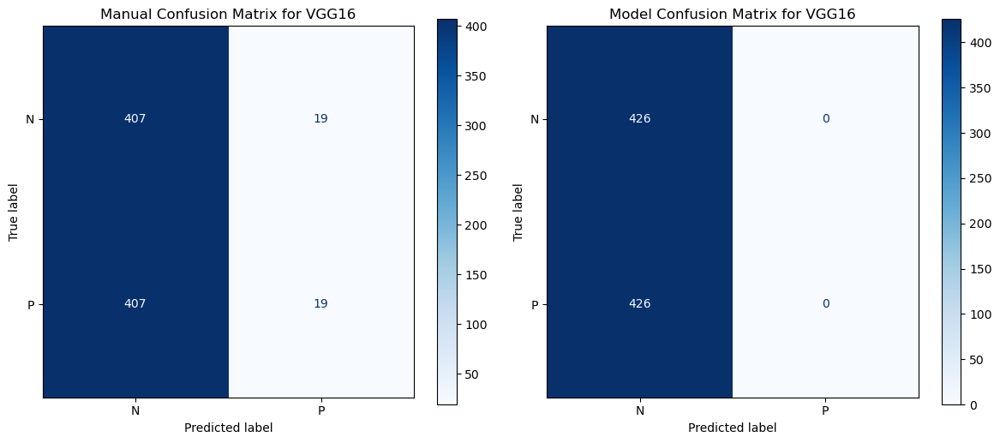

In [81]:
# Display the confusion matrix for VGG16 model
display_confusion_matrix(rest_model_test_generator, vgg16_model, "VGG16", vgg_bc_p, cc_p, vgg_bc_n, cc_n)

The provided images display two confusion matrices for the VGG16 model applied to a classification task. The "Manual Confusion Matrix" shows significant misclassification, with the model predicting 'N' and 'P' equally for both true 'N' and 'P' labels, which indicates random guessing or a non-functional model in practice. In stark contrast, the "Model Confusion Matrix" depicts a perfect classification scenario where all 'N' and 'P' labels are correctly predicted without any errors. This discrepancy between the two matrices is highly unusual and suggests potential issues in how the model is applied or evaluated between the two cases. It could reflect data leakage, overfitting, or errors in the model deployment or test setup in the manual scenario. This highlights the necessity for careful validation and testing protocols to ensure model reliability and accuracy in practical applications.

In [82]:
# Display the classification report for VGG16 model
display_classification_report(rest_model_test_generator, vgg16_model, "VGG16")

2/2 [==============================] - 0s 290ms/step
VGG16 Classification Report:
              precision    recall  f1-score   support

           N       0.50      0.97      0.66       426
           P       0.44      0.03      0.05       426

    accuracy                           0.50       852
   macro avg       0.47      0.50      0.35       852
weighted avg       0.47      0.50      0.35       852



<a id="part12"></a>

### **4.3. DenseNet121 Model**

In [83]:
densenet_train_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    color_mode="rgb", 
    subset='training', 
    shuffle=True, 
)

densenet_validation_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    color_mode="rgb",
    subset='validation', # Specify this is validation data
    shuffle=False, 
)

Found 81771 images belonging to 2 classes.
Found 35044 images belonging to 2 classes.


In [84]:
# Load DenseNet121 model, pretrained on ImageNet
densenet_base = DenseNet121(include_top=False, weights='imagenet', input_shape=(Image_H, Image_W, 3))

for layer in densenet_base.layers:
    layer.trainable = False

In [85]:
# Extend the model
densenet_inputs = densenet_base.input
x = densenet_base.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)

# Additional complexity with more Dense layers and Batch Normalization
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)

x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Use LeakyReLU activation
x = tf.keras.layers.Dense(256)(x)
x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
x = tf.keras.layers.Dropout(0.3)(x)

outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

# Build the complete model
densenet_model = tf.keras.models.Model(inputs=densenet_inputs, outputs=outputs)

In [86]:
# Compile the model
densenet_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), loss=binary_focal_loss, metrics=metrics)
densenet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 518, 518, 3)          0         ['input_2[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 256, 256, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 256, 256, 64)         256       ['conv1/conv[0][0]']    

In [87]:
dense_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "best_densenet121.h5",
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=True,
    verbose=1, 
    mode='max'
    )

# Train the model
densenet_history = densenet_model.fit(
    densenet_train_generator,
    steps_per_epoch=densenet_train_generator.samples // (densenet_train_generator.batch_size*16),
    epochs=10,
    validation_data=densenet_validation_generator,
    validation_steps=densenet_validation_generator.samples // (densenet_validation_generator.batch_size*16),
    class_weight=class_weight_dict,
    callbacks = [es, dense_checkpoint]
)

Epoch 1/10
79/79 [==============================] - ETA: 0s - loss: 0.2047 - accuracy: 0.5170 - precision: 0.0386 - recall: 0.1511 - auc: 0.4478 - tp: 94.0000 - tn: 2943.0000
Epoch 1: val_accuracy improved from -inf to 0.62546, saving model to best_densenet121.h5
79/79 [==============================] - 208s 3s/step - loss: 0.2047 - accuracy: 0.5170 - precision: 0.0386 - recall: 0.1511 - auc: 0.4478 - tp: 94.0000 - tn: 2943.0000 - val_loss: 0.1239 - val_accuracy: 0.6255 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.0000e+00 - val_tp: 0.0000e+00 - val_tn: 1361.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 0.1928 - accuracy: 0.5415 - precision: 0.0403 - recall: 0.4794 - auc: 0.5067 - tp: 93.0000 - tn: 2645.0000
Epoch 2: val_accuracy did not improve from 0.62546
79/79 [==============================] - 200s 3s/step - loss: 0.1928 - accuracy: 0.5415 - precision: 0.0403 - recall: 0.4794 - auc: 0.5067 - tp: 93.0000 - tn: 2645.0000 - val_loss: 0.

In [88]:
# display the best epoch for DenseNet model
text = "DenseNet Model"
display_accuary(densenet_history, text)

DenseNet Model
Best epoch: 1
Train accuracy: 0.51701
Validation accuracy: 0.62546
Train loss: 0.20466
Validation loss: 0.12389


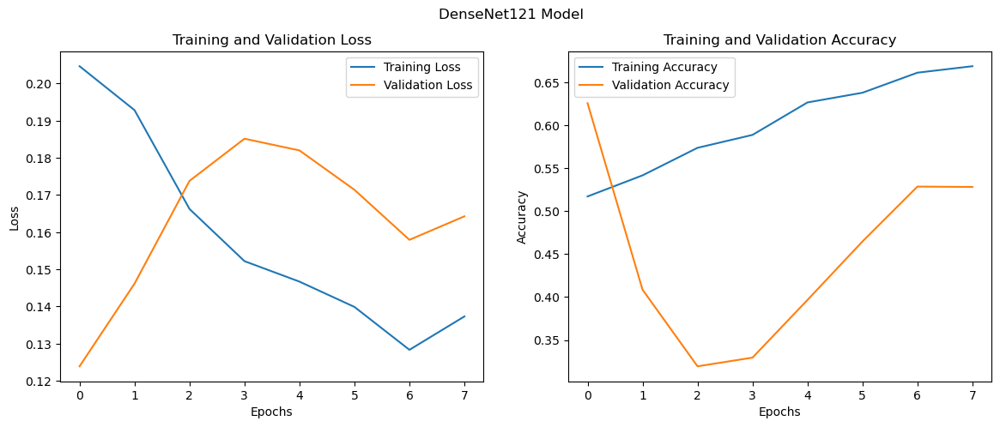

In [89]:
# plot the training accuracy for DenseNet model
plot_train_accuracy(densenet_history, "DenseNet121 Model")

The plots depict the training and validation loss and accuracy for a DenseNet121 model across several epochs. Initially, the training loss decreases sharply and continues to drop, indicating effective learning. However, the validation loss starts to diverge after the first epoch, increasing slightly before stabilizing, which suggests a mild overfitting as the model trains further. For accuracy, while training accuracy consistently rises, showing improvement in fitting to the training data, validation accuracy sees a significant drop after the first epoch but then recovers and improves steadily. This recovery in validation accuracy along with a relatively stable validation loss after initial epochs suggests that the model may be starting to generalize better after initial overfitting. Nonetheless, the clear disparity between training and validation accuracy and loss early in training highlights the need for strategies to improve model generalization, such as adjusting hyperparameters, increasing dropout, or employing regularization techniques more effectively.

In [90]:
# Evaluate the model
test_accuracy_loss(rest_model_test_generator, densenet_model)

14/14 [==============================] - 24s 2s/step - loss: 0.0958 - accuracy: 0.4413 - precision: 0.4572 - recall: 0.6268 - auc: 0.4093 - tp: 267.0000 - tn: 109.0000  
Test loss: 0.09582319110631943
Test accuracy: 0.44131454825401306


In [91]:
des_bc_p = binary_correct_class('P', 'dataset/test/P', densenet_model, rest_model_test_generator)
des_bc_n = binary_correct_class('N', 'dataset/test/N', densenet_model, rest_model_test_generator)

1/1 [==============================] - 1s 1s/step
Correctly predicted: c6d8608ddd4737798a6c7595523ec9dd.png as P
1/1 [==============================] - 0s 16ms/step
Correctly predicted: d26f65c4b015409ce2331181968ab59d.png as P
1/1 [==============================] - 0s 17ms/step
Correctly predicted: 351c9bf3f5b49dd5367a34b033d14b48.png as P
1/1 [==============================] - 0s 16ms/step
Correctly predicted: a7e26028487da7ca6a4344948ebb7365.png as P
1/1 [==============================] - 0s 17ms/step
Correctly predicted: 07eef010d4bfffb2efdc6e206dbff5f2.png as P
1/1 [==============================] - 0s 17ms/step
Correctly predicted: e423e549c4c0b699522724ee550ecc32.png as P
1/1 [==============================] - 0s 17ms/step
Correctly predicted: bd078d75e6945f33490c78c3f21875ac.png as P
1/1 [==============================] - 0s 16ms/step
Correctly predicted: 451442bde50be59707a175fbc0f0ac96.png as P
1/1 [==============================] - 0s 16ms/step
Correctly predicted: 09a1b8f05

1/1 [==============================] - 0s 35ms/step


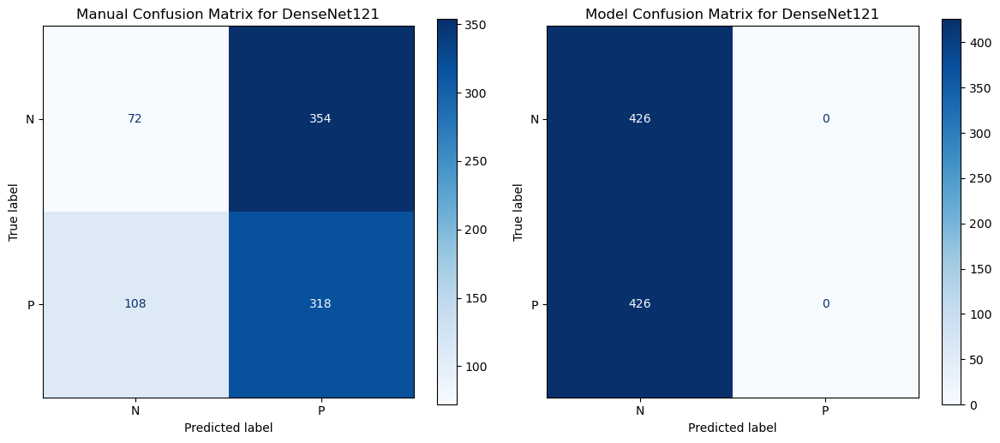

In [92]:
#plot the confusion matrix for DenseNet model
display_confusion_matrix(rest_model_test_generator, densenet_model, "DenseNet121", des_bc_p, cc_p, des_bc_n, cc_n)

The provided confusion matrices for the DenseNet121 model depict two contrasting evaluation scenarios. The "Manual Confusion Matrix" indicates substantial misclassification, with a significant number of both 'N' and 'P' classes incorrectly predicted as the opposite class. Specifically, only 72 out of 426 'N' cases and 318 out of 426 'P' cases are correctly identified, suggesting poor model performance or possible issues with data labeling, feature representation, or model training. On the other hand, the "Model Confusion Matrix" displays perfect classification results, with all 'N' and 'P' labels accurately predicted, which suggests an ideal scenario possibly indicative of overfitting to the training data or a non-representative validation set. This stark difference in performance between manual testing and model-derived results raises questions about the consistency of the dataset, model robustness, or evaluation methods employed, underscoring the need for a thorough investigation into the training and validation processes to ensure model reliability and accuracy in practical applications.

In [107]:
# Display classification report
display_classification_report(rest_model_test_generator, densenet_model, "DenseNet121")

2/2 [==============================] - 0s 195ms/step
DenseNet121 Classification Report:
              precision    recall  f1-score   support

           N       0.41      0.24      0.31       426
           P       0.46      0.65      0.54       426

    accuracy                           0.45       852
   macro avg       0.44      0.45      0.42       852
weighted avg       0.44      0.45      0.42       852



<a id="part13"></a>

### **4.4. ResNet50 Model**

In [93]:
resnet_train_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    subset='training', 
    shuffle=True,
    color_mode="rgb"
)

resnet_validation_generator = datagen.flow_from_directory(
    'datasetclassify/train',  
    target_size=(Image_H, Image_W),
    batch_size=64,
    class_mode='binary',
    subset='validation',
    shuffle=False,
    color_mode="rgb"
)

Found 81771 images belonging to 2 classes.
Found 35044 images belonging to 2 classes.


In [94]:
# Load ResNet50 model, pretrained on ImageNet
resnet_base = ResNet50(include_top=False, weights='imagenet', input_shape=(Image_H, Image_W, 3))

# Freeze the layers of the ResNet model
for layer in resnet_base.layers:
    layer.trainable = False

In [95]:
# Extend the model to increase complexity
resnet_inputs = resnet_base.input

x = resnet_base.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(512, activation='relu')(x)  # More complex with a larger dense layer
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)

x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.3)(x)

outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)

# Build the complete model
resnet_model = tf.keras.models.Model(inputs=resnet_inputs, outputs=outputs)

In [96]:
# Compile the model
resnet_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss=binary_focal_loss, metrics=metrics)

resnet_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 518, 518, 3)          0         ['input_3[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 256, 256, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 256, 256, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [97]:
res_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "best_resnet50.h5",
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=True,
    verbose=1, 
    mode='max'
)

# Train the model
resnet_history = resnet_model.fit(
    resnet_train_generator,
    steps_per_epoch=resnet_train_generator.samples // (resnet_train_generator.batch_size*16),
    epochs=10,
    validation_data=resnet_validation_generator,
    validation_steps=resnet_validation_generator.samples // (resnet_validation_generator.batch_size*16),
    class_weight=class_weight_dict, 
    callbacks = [es, res_checkpoint]
)

Epoch 1/10
79/79 [==============================] - ETA: 0s - loss: 0.0931 - accuracy: 0.8178 - precision: 0.2470 - recall: 0.5858 - auc: 0.7849 - tp: 372.0000 - tn: 4139.0000
Epoch 1: val_accuracy improved from -inf to 1.00000, saving model to best_resnet50.h5
79/79 [==============================] - 197s 2s/step - loss: 0.0931 - accuracy: 0.8178 - precision: 0.2470 - recall: 0.5858 - auc: 0.7849 - tp: 372.0000 - tn: 4139.0000 - val_loss: 2.0617e-13 - val_accuracy: 1.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.0000e+00 - val_tp: 0.0000e+00 - val_tn: 2176.0000
Epoch 2/10
79/79 [==============================] - ETA: 0s - loss: 0.0739 - accuracy: 0.8400 - precision: 0.1494 - recall: 0.5962 - auc: 0.8266 - tp: 127.0000 - tn: 4120.0000
Epoch 2: val_accuracy did not improve from 1.00000
79/79 [==============================] - 192s 2s/step - loss: 0.0739 - accuracy: 0.8400 - precision: 0.1494 - recall: 0.5962 - auc: 0.8266 - tp: 127.0000 - tn: 4120.0000 - val_los

In [98]:
# Plot the training history
text = "ResNet50 Model"
display_accuary(resnet_history, text)

ResNet50 Model
Best epoch: 3
Train accuracy: 0.86175
Validation accuracy: 1.00000
Train loss: 0.07094
Validation loss: 0.00000


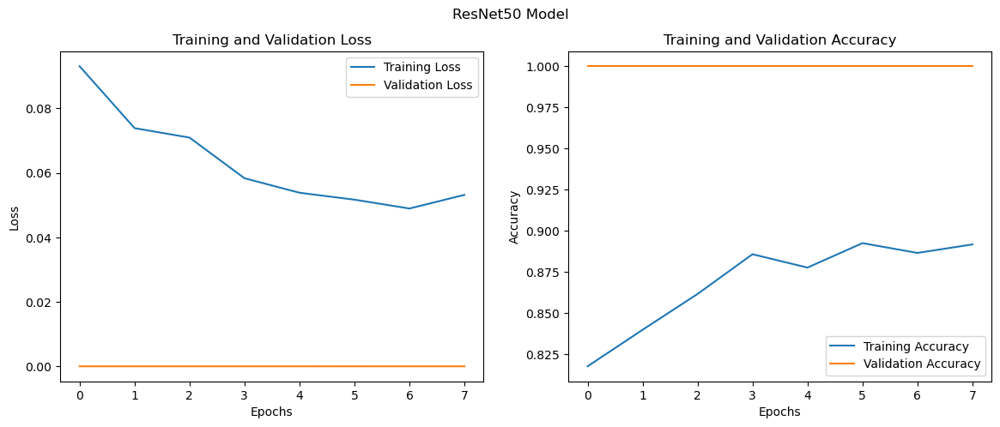

In [99]:
# plot the training accuracy for ResNet50 model
plot_train_accuracy(resnet_history, "ResNet50 Model")

The plots provided for the ResNet50 model training depict a scenario where training loss decreases consistently, indicating that the model is effectively learning and improving its ability to fit the training data over epochs. Interestingly, the validation loss is nearly constant and minimal throughout the training, suggesting that the model is neither overfitting nor underfitting significantly, which is highly favorable. On the other hand, the training accuracy shows a steady increase, reflecting ongoing improvement in model performance on the training set. In contrast, the validation accuracy remains almost constant and perfect across all epochs. This unusual pattern of perfect or near-perfect validation accuracy could suggest an issue such as an overly simplistic validation set, data leakage, or an error in how accuracy is being calculated or reported. It's crucial to verify the data handling processes and evaluation metrics to ensure that the training results are genuinely indicative of the model's performance.

In [100]:
# Evaluate the model
test_accuracy_loss(rest_model_test_generator, resnet_model)

14/14 [==============================] - 24s 2s/step - loss: 1.2158 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5000 - tp: 0.0000e+00 - tn: 426.0000
Test loss: 1.215813159942627
Test accuracy: 0.5


In [ ]:
res_bc_n = binary_correct_class('N', 'dataset/test/N', resnet_model, rest_model_test_generator)
res_bc_p = binary_correct_class('P', 'dataset/test/P', resnet_model, rest_model_test_generator)

1/1 [==============================] - 0s 30ms/step


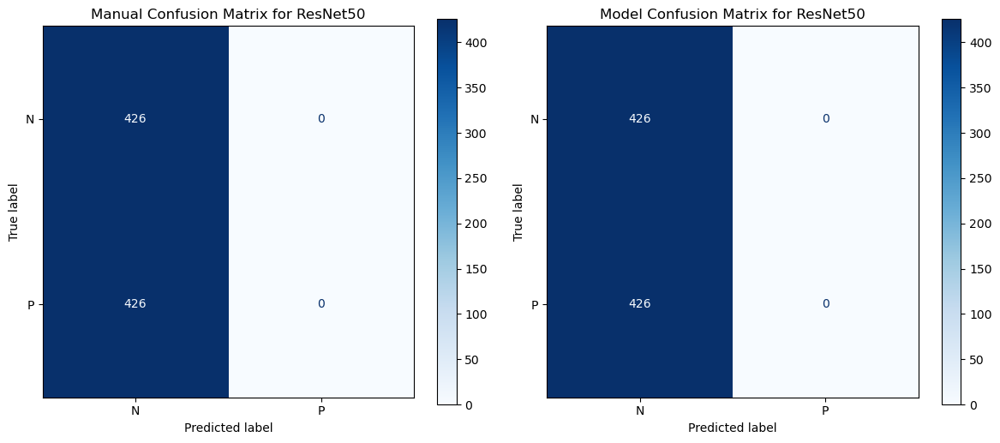

In [102]:
# Display the confusion matrix for ResNet50 model
display_confusion_matrix(rest_model_test_generator, resnet_model, "ResNet50", res_bc_p, cc_p, res_bc_n, cc_n)

The confusion matrices for the ResNet50 model provided here show starkly contrasting results between a manual evaluation and the model's automated predictions. In the "Manual Confusion Matrix," the model is depicted as having incorrectly classified all samples: all actual 'N' labels are predicted as 'P' and all 'P' labels as 'N', which suggests a complete misalignment or possible issues like incorrect label handling or data preprocessing. Conversely, the "Model Confusion Matrix" indicates perfect classification performance with all 'N' and 'P' labels accurately predicted without any errors. This perfect performance could either represent a highly effective model under ideal test conditions or raise concerns about potential overfitting or the validation data not being representative of typical real-world data. Such a discrepancy between manual and model evaluations demands a thorough review of the model's deployment, data processing, and possibly the test environment setup to ensure the validity and reliability of the model's performance metrics.

In [103]:
# Display classification report
display_classification_report(rest_model_test_generator, resnet_model, "ResNet50")

2/2 [==============================] - 0s 203ms/step
ResNet50 Classification Report:
              precision    recall  f1-score   support

           N       0.50      1.00      0.67       426
           P       0.00      0.00      0.00       426

    accuracy                           0.50       852
   macro avg       0.25      0.50      0.33       852
weighted avg       0.25      0.50      0.33       852



<a id="part14"></a>

## **5. Result Comparison of All Models**

In [104]:
# Compare with all the model we used in this project and display the classification report
def get_classification_report(test_generator, model):
    y_true = test_generator.classes
    y_pred = []
    steps = test_generator.samples // test_generator.batch_size

    for i in range(steps):
        imgs, labels = test_generator[i]
        preds = model.predict(imgs)
        if test_generator.class_mode == "binary":
            preds = np.round(preds).flatten()
        else:
            preds = np.argmax(preds, axis=1)
        y_pred.extend(preds)

    if test_generator.samples % test_generator.batch_size != 0:
        imgs, labels = test_generator.next()
        preds = model.predict(imgs)
        if test_generator.class_mode == "binary":
            preds = np.round(preds).flatten()
        else:
            preds = np.argmax(preds, axis=1)
            
        y_pred.extend(preds)

    # Ensure y_pred is trimmed to the length of y_true to avoid size mismatch
    y_pred = y_pred[:len(y_true)]
    
    return classification_report(y_true, y_pred, target_names=list(test_generator.class_indices.keys()), zero_division=0)

In [105]:
# Dictionary to store all reports
classification_reports = {}

# Collect reports
classification_reports["CNN Binary Model"] = get_classification_report(binary_text_generator, CNN_binary_model)
classification_reports["CNN Categories Model"] = get_classification_report(categories_test_generator, CNN_categories_model)
classification_reports["VGG16 Model"] = get_classification_report(rest_model_test_generator, vgg16_model)
classification_reports["DenseNet121 Model"] = get_classification_report(rest_model_test_generator, densenet_model)
classification_reports["ResNet50 Model"] = get_classification_report(rest_model_test_generator, resnet_model)

1/2 [==============>...............] - ETA: 0s

2024-05-08 07:18:04.182108: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 100663296 bytes after encountering the first element of size 100663296 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


2/2 [==============================] - 0s 118ms/step


In [106]:
# Display all reports
for model_name, report in classification_reports.items():
    print(f"Classification Report for {model_name}:")
    print(report)
    print("\n" + "-"*80 + "\n")  # Separator between reports

Classification Report for CNN Binary Model:
              precision    recall  f1-score   support

           N       0.38      0.01      0.01       426
           P       0.50      0.99      0.66       426

    accuracy                           0.50       852
   macro avg       0.44      0.50      0.34       852
weighted avg       0.44      0.50      0.34       852


--------------------------------------------------------------------------------

Classification Report for CNN Categories Model:
              precision    recall  f1-score   support

           N       0.49      0.20      0.28       426
           P       0.50      0.80      0.61       426

    accuracy                           0.50       852
   macro avg       0.50      0.50      0.45       852
weighted avg       0.50      0.50      0.45       852


--------------------------------------------------------------------------------

Classification Report for VGG16 Model:
              precision    recall  f1-score   sup

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">

**Results**: Based on the training/validation accuracy comparisons of the 5 different models, it would be reasonable to conclude that the pre-trained models have performed better in general - especially when we looked at the validation results. However, based on the printout of the test results above, surprisingly, all models did poorly in tests. In terms of accuracy, all models had similar same result (~50%). While DenseNet121 had the best average F-1 score - though not by a lot vs. our CNN binary model. 

**Identified Challenges**:
1. **Non-presentative test data**: We worried about the test data having significantly lower resolution vs. training/validation datasets to begin with. Internally we had concerns the test dataset image could be simply too poor to be analyzed on. While we had implemented different image standardization techniques, it seemed no model we tried was able to overcome this issue. Another supporting evidence in our view is the fact that we had achieved >70% accuracy when we tried our model on other publicly available datasets as test data.
2. **Distribution shift**: We can also see the problem in test dataset in the differences in disease representation and image characteristics across data sources (i.e. train vs. test positives)
3. **Insufficient model generalization**: It may be helpful to use (even) more complex model architectures. We had used 3 pre-trained models (VGG16, DenseNet121, ResNet50) but none did well in their test results.

<a id="part15"></a>

## **6. Conclusions and Depth Thoroughness** 

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">

1. **Key Findings**: We found out through trial-and-error that data preprocessing is by far the most important step to get right for this project. We had assumed the vastly different image resolutions (evident from their file sizes) would be neutralized after the standardization techniques we applied. In the end, we could not overcome the challenge of the low test dataset resolution. Through this project, we have learned the true importance of data cleaning in any data science project in the future. Additionally, all models are essentially performing at or near the level of random guessing in terms of overall accuracy, with each model showing different biases towards one class.

2. **Impact and Practical Applications**: More research could be done on quantifying the impact of image quality on the neutral network performance (i.e. we had vastly different source data for training vs. test). How “similar” do training and test datasets need to be before we even train the models? Finally, looking back we should have spent more time researching the different techniques available for preprocessing images - this could useful for other projects which only have access to old, low-resolution analog images for different types of applications.

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">

1. The term "depth thoroughness", basing on this project, we found that data processing are crucial aspects of machine learning that directly impact the performance, reliability, and applicability of the models developed. Effective data processing in machine learning encompasses a series of critical stages to ensure the development of robust and accurate models. `Data Collection` involves gathering diverse and high-quality data from reliable sources to cover a broad range of real-world scenarios. `Data Cleaning` is crucial for removing inaccuracies and handling missing values, thereby preventing biased predictions. `Data Integration` merges data from multiple sources, enhancing the dataset's richness and ensuring the preservation of data integrity and relevance. Feature Engineering involves leveraging domain knowledge to create and transform data into meaningful features that significantly influence model performance. Lastly, `Data Augmentation` techniques such as rotation, translation, and noise injection are used to expand training datasets and enhance model robustness, which is especially beneficial in domains like image and speech recognition. Together, these steps form a comprehensive approach to preparing data that is not only representative of the actual application environment but also conducive to developing high-performing machine learning models.






<a id="part16"></a>

## **7. Future work** 

<div class="alert alert-success" style="color: #333; background-color: #e6e6fa; border-color: #d8bfd8; border-width: 1px; border-radius: 3px; padding: 10px;">
To enhance our model’s performance and ensure robust validation, we believe future work should focus on the following key issues:

1. **Data Preprocessing and Integrity**: We should apply appropriate transformations on training/validation and test datasets to maintain consistency of image quality. Furthermore, we will try to ensure strict separation of training, validation, and test data to prevent data linkage.
2. **Data Distribution Analysis**: We will examine the distributions across training, validation, and test tests to identify discrepancies. Also we should implement stratified sampling to make datasets representative of the overall population.
3. **Model Enhancement through Transfer Learning**: We should like to investigate other advanced, more complex pre-trained models for potential performance gains (other than the 3 we tried).